# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_GSM_new.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)

adata.X = adata.layers["counts"].copy()
del adata.layers
adata.obs.loc[adata.obs["dose"] == "0.0", "dose_val"] = 0.0
d = {i: ind for ind, i in enumerate(sorted(adata.obs["dose"].astype(float).unique()))}
adata.obs["dose_training"] = [d[float(i)] for i in adata.obs["dose"]]
gc.collect()

12

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|dose_training",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|condition",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "dose_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['condition', 'dose_training']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

# tardis.MyModel.setup_wandb(
#     wandb_configurations=tardis.config.wandb,
#     hyperparams=dict(
#         model_params=model_params,
#         train_params=train_params,
#         dataset_params=dataset_params,
#     )
# )

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "cpa_sciplex_v1"
)

vae.save(
    dir_path,
    overwrite=True,
)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
  rank_zero_warn(
GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
  rank_zero_warn(


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `training` set. Number of elements in each group: 1714,1566,1437,1764,1407,1545,1429,987
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 1551,3592,2210,2782,1714
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `validation` set. Number of elements in each group: 441,395,355,407,383,395,338,248
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 388,876,550,707,441
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:11<1:57:45, 11.80s/it]

Epoch 1/600:   0%|          | 1/600 [00:11<1:57:45, 11.80s/it, v_num=1, total_loss_train=2.67e+3, kl_local_train=34.8]

Epoch 2/600:   0%|          | 1/600 [00:11<1:57:45, 11.80s/it, v_num=1, total_loss_train=2.67e+3, kl_local_train=34.8]

Epoch 2/600:   0%|          | 2/600 [00:16<1:14:40,  7.49s/it, v_num=1, total_loss_train=2.67e+3, kl_local_train=34.8]

Epoch 2/600:   0%|          | 2/600 [00:16<1:14:40,  7.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=53.3]

Epoch 3/600:   0%|          | 2/600 [00:16<1:14:40,  7.49s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=53.3]

Epoch 3/600:   0%|          | 3/600 [00:20<1:00:46,  6.11s/it, v_num=1, total_loss_train=2.22e+3, kl_local_train=53.3]

Epoch 3/600:   0%|          | 3/600 [00:20<1:00:46,  6.11s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=55.7] 

Epoch 4/600:   0%|          | 3/600 [00:20<1:00:46,  6.11s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=55.7]

Epoch 4/600:   1%|          | 4/600 [00:25<54:12,  5.46s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=55.7]  

Epoch 4/600:   1%|          | 4/600 [00:25<54:12,  5.46s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=54.5]

Epoch 5/600:   1%|          | 4/600 [00:25<54:12,  5.46s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=54.5]

Epoch 5/600:   1%|          | 5/600 [00:30<51:51,  5.23s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=54.5]

Epoch 5/600:   1%|          | 5/600 [00:30<51:51,  5.23s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=50.5]

Epoch 6/600:   1%|          | 5/600 [00:30<51:51,  5.23s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=50.5]

Epoch 6/600:   1%|          | 6/600 [00:35<51:21,  5.19s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=50.5]

Epoch 6/600:   1%|          | 6/600 [00:35<51:21,  5.19s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=40.5, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 7/600:   1%|          | 6/600 [00:35<51:21,  5.19s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=40.5, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 7/600:   1%|          | 7/600 [00:39<48:59,  4.96s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=40.5, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 7/600:   1%|          | 7/600 [00:39<48:59,  4.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=42.5, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 8/600:   1%|          | 7/600 [00:39<48:59,  4.96s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=42.5, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 8/600:   1%|▏         | 8/600 [00:44<47:24,  4.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=42.5, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 8/600:   1%|▏         | 8/600 [00:44<47:24,  4.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=48.5, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 9/600:   1%|▏         | 8/600 [00:44<47:24,  4.80s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=48.5, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 9/600:   2%|▏         | 9/600 [00:48<46:19,  4.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=48.5, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 9/600:   2%|▏         | 9/600 [00:48<46:19,  4.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=44.8, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 10/600:   2%|▏         | 9/600 [00:48<46:19,  4.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=44.8, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 10/600:   2%|▏         | 10/600 [00:53<46:18,  4.71s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=44.8, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 10/600:   2%|▏         | 10/600 [00:53<46:18,  4.71s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=49, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]  

Epoch 11/600:   2%|▏         | 10/600 [00:53<46:18,  4.71s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=49, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 11/600:   2%|▏         | 11/600 [00:58<47:10,  4.81s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=49, metric_mi|dose_training_train=0.0386, metric_mi|condition_train=0.0317]

Epoch 11/600:   2%|▏         | 11/600 [00:58<47:10,  4.81s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=55.6, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 12/600:   2%|▏         | 11/600 [00:58<47:10,  4.81s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=55.6, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 12/600:   2%|▏         | 12/600 [01:02<46:07,  4.71s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=55.6, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 12/600:   2%|▏         | 12/600 [01:02<46:07,  4.71s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 13/600:   2%|▏         | 12/600 [01:02<46:07,  4.71s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 13/600:   2%|▏         | 13/600 [01:07<45:19,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 13/600:   2%|▏         | 13/600 [01:07<45:19,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 14/600:   2%|▏         | 13/600 [01:07<45:19,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 14/600:   2%|▏         | 14/600 [01:11<44:52,  4.59s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 14/600:   2%|▏         | 14/600 [01:11<44:52,  4.59s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 15/600:   2%|▏         | 14/600 [01:11<44:52,  4.59s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 15/600:   2%|▎         | 15/600 [01:16<45:07,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=83.9, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 15/600:   2%|▎         | 15/600 [01:16<45:07,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.8, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 16/600:   2%|▎         | 15/600 [01:17<45:07,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.8, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 16/600:   3%|▎         | 16/600 [01:21<46:22,  4.76s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=98.8, metric_mi|dose_training_train=0.0571, metric_mi|condition_train=0.143]

Epoch 16/600:   3%|▎         | 16/600 [01:21<46:22,  4.76s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=115, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]  

Epoch 17/600:   3%|▎         | 16/600 [01:21<46:22,  4.76s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=115, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 17/600:   3%|▎         | 17/600 [01:26<45:27,  4.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=115, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 17/600:   3%|▎         | 17/600 [01:26<45:27,  4.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=132, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 18/600:   3%|▎         | 17/600 [01:26<45:27,  4.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=132, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 18/600:   3%|▎         | 18/600 [01:30<44:44,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=132, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 18/600:   3%|▎         | 18/600 [01:30<44:44,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=155, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 19/600:   3%|▎         | 18/600 [01:30<44:44,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=155, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 19/600:   3%|▎         | 19/600 [01:34<44:12,  4.56s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=155, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 19/600:   3%|▎         | 19/600 [01:34<44:12,  4.56s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=171, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 20/600:   3%|▎         | 19/600 [01:34<44:12,  4.56s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=171, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 20/600:   3%|▎         | 20/600 [01:39<44:27,  4.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=171, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 20/600:   3%|▎         | 20/600 [01:39<44:27,  4.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=186, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 21/600:   3%|▎         | 20/600 [01:40<44:27,  4.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=186, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 21/600:   4%|▎         | 21/600 [01:44<45:43,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=186, metric_mi|dose_training_train=0.114, metric_mi|condition_train=0.181]

Epoch 21/600:   4%|▎         | 21/600 [01:44<45:43,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=204, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]  

Epoch 22/600:   4%|▎         | 21/600 [01:44<45:43,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=204, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 22/600:   4%|▎         | 22/600 [01:49<44:56,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=204, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 22/600:   4%|▎         | 22/600 [01:49<44:56,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=214, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 23/600:   4%|▎         | 22/600 [01:49<44:56,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=214, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 23/600:   4%|▍         | 23/600 [01:53<44:22,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=214, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 23/600:   4%|▍         | 23/600 [01:53<44:22,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=228, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 24/600:   4%|▍         | 23/600 [01:53<44:22,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=228, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 24/600:   4%|▍         | 24/600 [01:58<43:55,  4.58s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=228, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 24/600:   4%|▍         | 24/600 [01:58<43:55,  4.58s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=234, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 25/600:   4%|▍         | 24/600 [01:58<43:55,  4.58s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=234, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 25/600:   4%|▍         | 25/600 [02:02<44:09,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=234, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 25/600:   4%|▍         | 25/600 [02:02<44:09,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=252, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 26/600:   4%|▍         | 25/600 [02:03<44:09,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=252, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 26/600:   4%|▍         | 26/600 [02:07<45:20,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=252, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.227]

Epoch 26/600:   4%|▍         | 26/600 [02:07<45:20,  4.74s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=256, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 27/600:   4%|▍         | 26/600 [02:07<45:20,  4.74s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=256, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 27/600:   4%|▍         | 27/600 [02:12<44:31,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=256, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 27/600:   4%|▍         | 27/600 [02:12<44:31,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=268, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 28/600:   4%|▍         | 27/600 [02:12<44:31,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=268, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 28/600:   5%|▍         | 28/600 [02:16<44:02,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=268, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 28/600:   5%|▍         | 28/600 [02:16<44:02,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=281, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 29/600:   5%|▍         | 28/600 [02:16<44:02,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=281, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 29/600:   5%|▍         | 29/600 [02:21<43:34,  4.58s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=281, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 29/600:   5%|▍         | 29/600 [02:21<43:34,  4.58s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=274, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 30/600:   5%|▍         | 29/600 [02:21<43:34,  4.58s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=274, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 30/600:   5%|▌         | 30/600 [02:26<43:51,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=274, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 30/600:   5%|▌         | 30/600 [02:26<43:51,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=286, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 31/600:   5%|▌         | 30/600 [02:26<43:51,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=286, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 31/600:   5%|▌         | 31/600 [02:31<45:09,  4.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=286, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.243]

Epoch 31/600:   5%|▌         | 31/600 [02:31<45:09,  4.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=283, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 32/600:   5%|▌         | 31/600 [02:31<45:09,  4.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=283, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 32/600:   5%|▌         | 32/600 [02:35<44:17,  4.68s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=283, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 32/600:   5%|▌         | 32/600 [02:35<44:17,  4.68s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=291, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 33/600:   5%|▌         | 32/600 [02:35<44:17,  4.68s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=291, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 33/600:   6%|▌         | 33/600 [02:40<43:39,  4.62s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=291, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 33/600:   6%|▌         | 33/600 [02:40<43:39,  4.62s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=283, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 34/600:   6%|▌         | 33/600 [02:40<43:39,  4.62s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=283, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 34/600:   6%|▌         | 34/600 [02:44<43:16,  4.59s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=283, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 34/600:   6%|▌         | 34/600 [02:44<43:16,  4.59s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=285, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 35/600:   6%|▌         | 34/600 [02:44<43:16,  4.59s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=285, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 35/600:   6%|▌         | 35/600 [02:49<43:34,  4.63s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=285, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 35/600:   6%|▌         | 35/600 [02:49<43:34,  4.63s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=290, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 36/600:   6%|▌         | 35/600 [02:49<43:34,  4.63s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=290, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 36/600:   6%|▌         | 36/600 [02:54<44:48,  4.77s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=290, metric_mi|dose_training_train=0.245, metric_mi|condition_train=0.248]

Epoch 36/600:   6%|▌         | 36/600 [02:54<44:48,  4.77s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=287, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 37/600:   6%|▌         | 36/600 [02:54<44:48,  4.77s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=287, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 37/600:   6%|▌         | 37/600 [02:58<43:56,  4.68s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=287, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 37/600:   6%|▌         | 37/600 [02:58<43:56,  4.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=288, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 38/600:   6%|▌         | 37/600 [02:58<43:56,  4.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=288, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 38/600:   6%|▋         | 38/600 [03:03<43:20,  4.63s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=288, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 38/600:   6%|▋         | 38/600 [03:03<43:20,  4.63s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=284, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 39/600:   6%|▋         | 38/600 [03:03<43:20,  4.63s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=284, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 39/600:   6%|▋         | 39/600 [03:07<42:57,  4.59s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=284, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 39/600:   6%|▋         | 39/600 [03:07<42:57,  4.59s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=285, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 40/600:   6%|▋         | 39/600 [03:07<42:57,  4.59s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=285, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 40/600:   7%|▋         | 40/600 [03:12<43:17,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=285, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 40/600:   7%|▋         | 40/600 [03:12<43:17,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=288, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 41/600:   7%|▋         | 40/600 [03:13<43:17,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=288, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 41/600:   7%|▋         | 41/600 [03:17<44:22,  4.76s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=288, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.251]

Epoch 41/600:   7%|▋         | 41/600 [03:17<44:22,  4.76s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=281, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 42/600:   7%|▋         | 41/600 [03:17<44:22,  4.76s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=281, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 42/600:   7%|▋         | 42/600 [03:22<43:33,  4.68s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=281, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 42/600:   7%|▋         | 42/600 [03:22<43:33,  4.68s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=286, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 43/600:   7%|▋         | 42/600 [03:22<43:33,  4.68s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=286, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 43/600:   7%|▋         | 43/600 [03:26<42:54,  4.62s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=286, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 43/600:   7%|▋         | 43/600 [03:26<42:54,  4.62s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=288, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 44/600:   7%|▋         | 43/600 [03:26<42:54,  4.62s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=288, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 44/600:   7%|▋         | 44/600 [03:31<42:28,  4.58s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=288, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 44/600:   7%|▋         | 44/600 [03:31<42:28,  4.58s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=279, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 45/600:   7%|▋         | 44/600 [03:31<42:28,  4.58s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=279, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 45/600:   8%|▊         | 45/600 [03:35<42:43,  4.62s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=279, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 45/600:   8%|▊         | 45/600 [03:35<42:43,  4.62s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=283, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 46/600:   8%|▊         | 45/600 [03:36<42:43,  4.62s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=283, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 46/600:   8%|▊         | 46/600 [03:41<43:57,  4.76s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=283, metric_mi|dose_training_train=0.254, metric_mi|condition_train=0.252]

Epoch 46/600:   8%|▊         | 46/600 [03:41<43:57,  4.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=284, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248] 

Epoch 47/600:   8%|▊         | 46/600 [03:41<43:57,  4.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=284, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 47/600:   8%|▊         | 47/600 [03:45<43:10,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=284, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 47/600:   8%|▊         | 47/600 [03:45<43:10,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=283, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 48/600:   8%|▊         | 47/600 [03:45<43:10,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=283, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 48/600:   8%|▊         | 48/600 [03:50<42:37,  4.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=283, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 48/600:   8%|▊         | 48/600 [03:50<42:37,  4.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=285, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 49/600:   8%|▊         | 48/600 [03:50<42:37,  4.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=285, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 49/600:   8%|▊         | 49/600 [03:54<42:10,  4.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=285, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 49/600:   8%|▊         | 49/600 [03:54<42:10,  4.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=283, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 50/600:   8%|▊         | 49/600 [03:54<42:10,  4.59s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=283, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 50/600:   8%|▊         | 50/600 [03:59<42:19,  4.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=283, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 50/600:   8%|▊         | 50/600 [03:59<42:19,  4.62s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=271, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 51/600:   8%|▊         | 50/600 [03:59<42:19,  4.62s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=271, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 51/600:   8%|▊         | 51/600 [04:04<43:27,  4.75s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=271, metric_mi|dose_training_train=0.259, metric_mi|condition_train=0.248]

Epoch 51/600:   8%|▊         | 51/600 [04:04<43:27,  4.75s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=274, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 52/600:   8%|▊         | 51/600 [04:04<43:27,  4.75s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=274, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 52/600:   9%|▊         | 52/600 [04:08<42:44,  4.68s/it, v_num=1, total_loss_train=2.21e+3, kl_local_train=274, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 52/600:   9%|▊         | 52/600 [04:08<42:44,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=272, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243] 

Epoch 53/600:   9%|▊         | 52/600 [04:08<42:44,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=272, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 53/600:   9%|▉         | 53/600 [04:13<42:07,  4.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=272, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 53/600:   9%|▉         | 53/600 [04:13<42:07,  4.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=278, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 54/600:   9%|▉         | 53/600 [04:13<42:07,  4.62s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=278, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 54/600:   9%|▉         | 54/600 [04:17<41:39,  4.58s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=278, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 54/600:   9%|▉         | 54/600 [04:17<41:39,  4.58s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=272, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 55/600:   9%|▉         | 54/600 [04:17<41:39,  4.58s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=272, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 55/600:   9%|▉         | 55/600 [04:22<41:54,  4.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=272, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 55/600:   9%|▉         | 55/600 [04:22<41:54,  4.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=267, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 56/600:   9%|▉         | 55/600 [04:23<41:54,  4.61s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=267, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 56/600:   9%|▉         | 56/600 [04:27<43:06,  4.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=267, metric_mi|dose_training_train=0.258, metric_mi|condition_train=0.243]

Epoch 56/600:   9%|▉         | 56/600 [04:27<43:06,  4.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=257, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 57/600:   9%|▉         | 56/600 [04:27<43:06,  4.75s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=257, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 57/600:  10%|▉         | 57/600 [04:32<42:20,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=257, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 57/600:  10%|▉         | 57/600 [04:32<42:20,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=242, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 58/600:  10%|▉         | 57/600 [04:32<42:20,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=242, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 58/600:  10%|▉         | 58/600 [04:36<41:50,  4.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=242, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 58/600:  10%|▉         | 58/600 [04:36<41:50,  4.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=239, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 59/600:  10%|▉         | 58/600 [04:36<41:50,  4.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=239, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 59/600:  10%|▉         | 59/600 [04:41<41:26,  4.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=239, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 59/600:  10%|▉         | 59/600 [04:41<41:26,  4.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=239, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 60/600:  10%|▉         | 59/600 [04:41<41:26,  4.60s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=239, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 60/600:  10%|█         | 60/600 [04:45<41:38,  4.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=239, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 60/600:  10%|█         | 60/600 [04:45<41:38,  4.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=231, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 61/600:  10%|█         | 60/600 [04:46<41:38,  4.63s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=231, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 61/600:  10%|█         | 61/600 [04:50<42:45,  4.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=231, metric_mi|dose_training_train=0.251, metric_mi|condition_train=0.241]

Epoch 61/600:  10%|█         | 61/600 [04:50<42:45,  4.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=238, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 62/600:  10%|█         | 61/600 [04:50<42:45,  4.76s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=238, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 62/600:  10%|█         | 62/600 [04:55<41:58,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=238, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 62/600:  10%|█         | 62/600 [04:55<41:58,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=234, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 63/600:  10%|█         | 62/600 [04:55<41:58,  4.68s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=234, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 63/600:  10%|█         | 63/600 [04:59<41:30,  4.64s/it, v_num=1, total_loss_train=2.2e+3, kl_local_train=234, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 63/600:  10%|█         | 63/600 [04:59<41:30,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=231, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 64/600:  10%|█         | 63/600 [04:59<41:30,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=231, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 64/600:  11%|█         | 64/600 [05:04<41:09,  4.61s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=231, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 64/600:  11%|█         | 64/600 [05:04<41:09,  4.61s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=222, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 65/600:  11%|█         | 64/600 [05:04<41:09,  4.61s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=222, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 65/600:  11%|█         | 65/600 [05:09<41:47,  4.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=222, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 65/600:  11%|█         | 65/600 [05:09<41:47,  4.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=219, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 66/600:  11%|█         | 65/600 [05:09<41:47,  4.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=219, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 66/600:  11%|█         | 66/600 [05:14<42:45,  4.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=219, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.243]

Epoch 66/600:  11%|█         | 66/600 [05:14<42:45,  4.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=217, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 67/600:  11%|█         | 66/600 [05:14<42:45,  4.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=217, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 67/600:  11%|█         | 67/600 [05:18<41:49,  4.71s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=217, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 67/600:  11%|█         | 67/600 [05:18<41:49,  4.71s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=213, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 68/600:  11%|█         | 67/600 [05:18<41:49,  4.71s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=213, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 68/600:  11%|█▏        | 68/600 [05:23<41:06,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=213, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 68/600:  11%|█▏        | 68/600 [05:23<41:06,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=213, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 69/600:  11%|█▏        | 68/600 [05:23<41:06,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=213, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 69/600:  12%|█▏        | 69/600 [05:28<41:27,  4.68s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=213, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 69/600:  12%|█▏        | 69/600 [05:28<41:27,  4.68s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=216, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 70/600:  12%|█▏        | 69/600 [05:28<41:27,  4.68s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=216, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 70/600:  12%|█▏        | 70/600 [05:32<41:29,  4.70s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=216, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 70/600:  12%|█▏        | 70/600 [05:32<41:29,  4.70s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=212, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 71/600:  12%|█▏        | 70/600 [05:33<41:29,  4.70s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=212, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 71/600:  12%|█▏        | 71/600 [05:37<42:19,  4.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=212, metric_mi|dose_training_train=0.243, metric_mi|condition_train=0.247]

Epoch 71/600:  12%|█▏        | 71/600 [05:37<42:19,  4.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=214, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25] 

Epoch 72/600:  12%|█▏        | 71/600 [05:37<42:19,  4.80s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=214, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 72/600:  12%|█▏        | 72/600 [05:42<41:21,  4.70s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=214, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 72/600:  12%|█▏        | 72/600 [05:42<41:21,  4.70s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=212, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 73/600:  12%|█▏        | 72/600 [05:42<41:21,  4.70s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=212, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 73/600:  12%|█▏        | 73/600 [05:46<40:44,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=212, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 73/600:  12%|█▏        | 73/600 [05:46<40:44,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=211, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 74/600:  12%|█▏        | 73/600 [05:46<40:44,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=211, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 74/600:  12%|█▏        | 74/600 [05:51<40:20,  4.60s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=211, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 74/600:  12%|█▏        | 74/600 [05:51<40:20,  4.60s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=206, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 75/600:  12%|█▏        | 74/600 [05:51<40:20,  4.60s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=206, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 75/600:  12%|█▎        | 75/600 [05:56<40:33,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=206, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 75/600:  12%|█▎        | 75/600 [05:56<40:33,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=203, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 76/600:  12%|█▎        | 75/600 [05:56<40:33,  4.64s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=203, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 76/600:  13%|█▎        | 76/600 [06:01<41:40,  4.77s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=203, metric_mi|dose_training_train=0.242, metric_mi|condition_train=0.25]

Epoch 76/600:  13%|█▎        | 76/600 [06:01<41:40,  4.77s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=205, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 77/600:  13%|█▎        | 76/600 [06:01<41:40,  4.77s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=205, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 77/600:  13%|█▎        | 77/600 [06:05<40:52,  4.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=205, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 77/600:  13%|█▎        | 77/600 [06:05<40:52,  4.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=199, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 78/600:  13%|█▎        | 77/600 [06:05<40:52,  4.69s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=199, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 78/600:  13%|█▎        | 78/600 [06:10<40:15,  4.63s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=199, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 78/600:  13%|█▎        | 78/600 [06:10<40:15,  4.63s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=197, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 79/600:  13%|█▎        | 78/600 [06:10<40:15,  4.63s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=197, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 79/600:  13%|█▎        | 79/600 [06:14<39:49,  4.59s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=197, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 79/600:  13%|█▎        | 79/600 [06:14<39:49,  4.59s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=195, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 80/600:  13%|█▎        | 79/600 [06:14<39:49,  4.59s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=195, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 80/600:  13%|█▎        | 80/600 [06:19<40:07,  4.63s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=195, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 80/600:  13%|█▎        | 80/600 [06:19<40:07,  4.63s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=193, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 81/600:  13%|█▎        | 80/600 [06:19<40:07,  4.63s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=193, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 81/600:  14%|█▎        | 81/600 [06:24<41:12,  4.76s/it, v_num=1, total_loss_train=2.19e+3, kl_local_train=193, metric_mi|dose_training_train=0.236, metric_mi|condition_train=0.242]

Epoch 81/600:  14%|█▎        | 81/600 [06:24<41:12,  4.76s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=190, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 82/600:  14%|█▎        | 81/600 [06:24<41:12,  4.76s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=190, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 82/600:  14%|█▎        | 82/600 [06:29<40:36,  4.70s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=190, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 82/600:  14%|█▎        | 82/600 [06:29<40:36,  4.70s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=186, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 83/600:  14%|█▎        | 82/600 [06:29<40:36,  4.70s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=186, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 83/600:  14%|█▍        | 83/600 [06:33<39:58,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=186, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 83/600:  14%|█▍        | 83/600 [06:33<39:58,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=188, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 84/600:  14%|█▍        | 83/600 [06:33<39:58,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=188, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 84/600:  14%|█▍        | 84/600 [06:38<39:31,  4.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=188, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 84/600:  14%|█▍        | 84/600 [06:38<39:31,  4.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=184, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 85/600:  14%|█▍        | 84/600 [06:38<39:31,  4.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=184, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 85/600:  14%|█▍        | 85/600 [06:42<39:49,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=184, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 85/600:  14%|█▍        | 85/600 [06:42<39:49,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=183, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 86/600:  14%|█▍        | 85/600 [06:43<39:49,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=183, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 86/600:  14%|█▍        | 86/600 [06:47<40:55,  4.78s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=183, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.244]

Epoch 86/600:  14%|█▍        | 86/600 [06:47<40:55,  4.78s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=184, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25] 

Epoch 87/600:  14%|█▍        | 86/600 [06:47<40:55,  4.78s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=184, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 87/600:  14%|█▍        | 87/600 [06:52<40:13,  4.70s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=184, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 87/600:  14%|█▍        | 87/600 [06:52<40:13,  4.70s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=181, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 88/600:  14%|█▍        | 87/600 [06:52<40:13,  4.70s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=181, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 88/600:  15%|█▍        | 88/600 [06:56<39:44,  4.66s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=181, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 88/600:  15%|█▍        | 88/600 [06:56<39:44,  4.66s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=176, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 89/600:  15%|█▍        | 88/600 [06:56<39:44,  4.66s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=176, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 89/600:  15%|█▍        | 89/600 [07:01<39:12,  4.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=176, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 89/600:  15%|█▍        | 89/600 [07:01<39:12,  4.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=175, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 90/600:  15%|█▍        | 89/600 [07:01<39:12,  4.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=175, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 90/600:  15%|█▌        | 90/600 [07:06<39:27,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=175, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 90/600:  15%|█▌        | 90/600 [07:06<39:27,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=172, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 91/600:  15%|█▌        | 90/600 [07:06<39:27,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=172, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 91/600:  15%|█▌        | 91/600 [07:11<40:23,  4.76s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=172, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.25]

Epoch 91/600:  15%|█▌        | 91/600 [07:11<40:23,  4.76s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=170, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 92/600:  15%|█▌        | 91/600 [07:11<40:23,  4.76s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=170, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 92/600:  15%|█▌        | 92/600 [07:15<39:36,  4.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=170, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 92/600:  15%|█▌        | 92/600 [07:15<39:36,  4.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=172, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 93/600:  15%|█▌        | 92/600 [07:15<39:36,  4.68s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=172, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 93/600:  16%|█▌        | 93/600 [07:20<39:02,  4.62s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=172, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 93/600:  16%|█▌        | 93/600 [07:20<39:02,  4.62s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=167, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 94/600:  16%|█▌        | 93/600 [07:20<39:02,  4.62s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=167, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 94/600:  16%|█▌        | 94/600 [07:24<38:43,  4.59s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=167, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 94/600:  16%|█▌        | 94/600 [07:24<38:43,  4.59s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=168, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 95/600:  16%|█▌        | 94/600 [07:24<38:43,  4.59s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=168, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 95/600:  16%|█▌        | 95/600 [07:29<39:00,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=168, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 95/600:  16%|█▌        | 95/600 [07:29<39:00,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=167, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 96/600:  16%|█▌        | 95/600 [07:29<39:00,  4.64s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=167, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 96/600:  16%|█▌        | 96/600 [07:34<40:00,  4.76s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=167, metric_mi|dose_training_train=0.227, metric_mi|condition_train=0.247]

Epoch 96/600:  16%|█▌        | 96/600 [07:34<40:00,  4.76s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=166, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 97/600:  16%|█▌        | 96/600 [07:34<40:00,  4.76s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=166, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 97/600:  16%|█▌        | 97/600 [07:38<39:16,  4.69s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=166, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 97/600:  16%|█▌        | 97/600 [07:38<39:16,  4.69s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=165, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 98/600:  16%|█▌        | 97/600 [07:38<39:16,  4.69s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=165, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 98/600:  16%|█▋        | 98/600 [07:43<38:44,  4.63s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=165, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 98/600:  16%|█▋        | 98/600 [07:43<38:44,  4.63s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=164, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 99/600:  16%|█▋        | 98/600 [07:43<38:44,  4.63s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=164, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 99/600:  16%|█▋        | 99/600 [07:48<38:25,  4.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=164, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 99/600:  16%|█▋        | 99/600 [07:48<38:25,  4.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=164, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 100/600:  16%|█▋        | 99/600 [07:48<38:25,  4.60s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=164, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 100/600:  17%|█▋        | 100/600 [07:52<38:43,  4.65s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=164, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 100/600:  17%|█▋        | 100/600 [07:52<38:43,  4.65s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=164, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 101/600:  17%|█▋        | 100/600 [07:53<38:43,  4.65s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=164, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 101/600:  17%|█▋        | 101/600 [07:57<39:40,  4.77s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=164, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.242]

Epoch 101/600:  17%|█▋        | 101/600 [07:57<39:40,  4.77s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=163, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 102/600:  17%|█▋        | 101/600 [07:57<39:40,  4.77s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=163, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 102/600:  17%|█▋        | 102/600 [08:02<38:53,  4.69s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=163, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 102/600:  17%|█▋        | 102/600 [08:02<38:53,  4.69s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=161, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 103/600:  17%|█▋        | 102/600 [08:02<38:53,  4.69s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=161, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 103/600:  17%|█▋        | 103/600 [08:06<38:23,  4.63s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=161, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 103/600:  17%|█▋        | 103/600 [08:06<38:23,  4.63s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=161, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 104/600:  17%|█▋        | 103/600 [08:06<38:23,  4.63s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=161, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 104/600:  17%|█▋        | 104/600 [08:12<40:15,  4.87s/it, v_num=1, total_loss_train=2.18e+3, kl_local_train=161, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 104/600:  17%|█▋        | 104/600 [08:12<40:15,  4.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=162, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 105/600:  17%|█▋        | 104/600 [08:12<40:15,  4.87s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=162, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 105/600:  18%|█▊        | 105/600 [08:16<39:49,  4.83s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=162, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 105/600:  18%|█▊        | 105/600 [08:16<39:49,  4.83s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=160, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 106/600:  18%|█▊        | 105/600 [08:17<39:49,  4.83s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=160, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 106/600:  18%|█▊        | 106/600 [08:22<40:26,  4.91s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=160, metric_mi|dose_training_train=0.224, metric_mi|condition_train=0.245]

Epoch 106/600:  18%|█▊        | 106/600 [08:22<40:26,  4.91s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=159, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 107/600:  18%|█▊        | 106/600 [08:22<40:26,  4.91s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=159, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 107/600:  18%|█▊        | 107/600 [08:26<39:26,  4.80s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=159, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 107/600:  18%|█▊        | 107/600 [08:26<39:26,  4.80s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=158, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 108/600:  18%|█▊        | 107/600 [08:26<39:26,  4.80s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=158, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 108/600:  18%|█▊        | 108/600 [08:31<38:39,  4.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=158, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 108/600:  18%|█▊        | 108/600 [08:31<38:39,  4.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=157, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 109/600:  18%|█▊        | 108/600 [08:31<38:39,  4.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=157, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 109/600:  18%|█▊        | 109/600 [08:35<38:05,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=157, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 109/600:  18%|█▊        | 109/600 [08:35<38:05,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=157, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 110/600:  18%|█▊        | 109/600 [08:35<38:05,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=157, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 110/600:  18%|█▊        | 110/600 [08:40<38:08,  4.67s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=157, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 110/600:  18%|█▊        | 110/600 [08:40<38:08,  4.67s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=157, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 111/600:  18%|█▊        | 110/600 [08:40<38:08,  4.67s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=157, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 111/600:  18%|█▊        | 111/600 [08:45<39:01,  4.79s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=157, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.245]

Epoch 111/600:  18%|█▊        | 111/600 [08:45<39:01,  4.79s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=156, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 112/600:  18%|█▊        | 111/600 [08:45<39:01,  4.79s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=156, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 112/600:  19%|█▊        | 112/600 [08:49<38:17,  4.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=156, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 112/600:  19%|█▊        | 112/600 [08:49<38:17,  4.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=158, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 113/600:  19%|█▊        | 112/600 [08:49<38:17,  4.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=158, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 113/600:  19%|█▉        | 113/600 [08:54<37:43,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=158, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 113/600:  19%|█▉        | 113/600 [08:54<37:43,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=154, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 114/600:  19%|█▉        | 113/600 [08:54<37:43,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=154, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 114/600:  19%|█▉        | 114/600 [08:58<37:20,  4.61s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=154, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 114/600:  19%|█▉        | 114/600 [08:58<37:20,  4.61s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=154, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 115/600:  19%|█▉        | 114/600 [08:58<37:20,  4.61s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=154, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 115/600:  19%|█▉        | 115/600 [09:03<37:36,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=154, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 115/600:  19%|█▉        | 115/600 [09:03<37:36,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=153, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 116/600:  19%|█▉        | 115/600 [09:04<37:36,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=153, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 116/600:  19%|█▉        | 116/600 [09:08<38:31,  4.77s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=153, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.242]

Epoch 116/600:  19%|█▉        | 116/600 [09:08<38:31,  4.77s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=152, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 117/600:  19%|█▉        | 116/600 [09:08<38:31,  4.77s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=152, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 117/600:  20%|█▉        | 117/600 [09:13<37:47,  4.69s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=152, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 117/600:  20%|█▉        | 117/600 [09:13<37:47,  4.69s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=151, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 118/600:  20%|█▉        | 117/600 [09:13<37:47,  4.69s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=151, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 118/600:  20%|█▉        | 118/600 [09:17<37:18,  4.64s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=151, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 118/600:  20%|█▉        | 118/600 [09:17<37:18,  4.64s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 119/600:  20%|█▉        | 118/600 [09:17<37:18,  4.64s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 119/600:  20%|█▉        | 119/600 [09:22<36:54,  4.60s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 119/600:  20%|█▉        | 119/600 [09:22<36:54,  4.60s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=151, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 120/600:  20%|█▉        | 119/600 [09:22<36:54,  4.60s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=151, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 120/600:  20%|██        | 120/600 [09:27<37:11,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=151, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 120/600:  20%|██        | 120/600 [09:27<37:11,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=150, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 121/600:  20%|██        | 120/600 [09:27<37:11,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=150, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 121/600:  20%|██        | 121/600 [09:32<38:07,  4.78s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=150, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 121/600:  20%|██        | 121/600 [09:32<38:07,  4.78s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=152, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 122/600:  20%|██        | 121/600 [09:32<38:07,  4.78s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=152, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 122/600:  20%|██        | 122/600 [09:36<37:24,  4.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=152, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 122/600:  20%|██        | 122/600 [09:36<37:24,  4.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=153, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 123/600:  20%|██        | 122/600 [09:36<37:24,  4.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=153, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 123/600:  20%|██        | 123/600 [09:41<36:56,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=153, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 123/600:  20%|██        | 123/600 [09:41<36:56,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=151, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 124/600:  20%|██        | 123/600 [09:41<36:56,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=151, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 124/600:  21%|██        | 124/600 [09:45<36:41,  4.62s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=151, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 124/600:  21%|██        | 124/600 [09:45<36:41,  4.62s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 125/600:  21%|██        | 124/600 [09:45<36:41,  4.62s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 125/600:  21%|██        | 125/600 [09:50<36:51,  4.66s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 125/600:  21%|██        | 125/600 [09:50<36:51,  4.66s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 126/600:  21%|██        | 125/600 [09:51<36:51,  4.66s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 126/600:  21%|██        | 126/600 [09:55<37:45,  4.78s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.238]

Epoch 126/600:  21%|██        | 126/600 [09:55<37:45,  4.78s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 127/600:  21%|██        | 126/600 [09:55<37:45,  4.78s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 127/600:  21%|██        | 127/600 [10:00<37:02,  4.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 127/600:  21%|██        | 127/600 [10:00<37:02,  4.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 128/600:  21%|██        | 127/600 [10:00<37:02,  4.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 128/600:  21%|██▏       | 128/600 [10:04<36:35,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=149, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 128/600:  21%|██▏       | 128/600 [10:04<36:35,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=148, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 129/600:  21%|██▏       | 128/600 [10:04<36:35,  4.65s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=148, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 129/600:  22%|██▏       | 129/600 [10:09<36:24,  4.64s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=148, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 129/600:  22%|██▏       | 129/600 [10:09<36:24,  4.64s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=147, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 130/600:  22%|██▏       | 129/600 [10:09<36:24,  4.64s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=147, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 130/600:  22%|██▏       | 130/600 [10:13<36:39,  4.68s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=147, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 130/600:  22%|██▏       | 130/600 [10:13<36:39,  4.68s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 131/600:  22%|██▏       | 130/600 [10:14<36:39,  4.68s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 131/600:  22%|██▏       | 131/600 [10:19<37:40,  4.82s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.237]

Epoch 131/600:  22%|██▏       | 131/600 [10:19<37:40,  4.82s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 132/600:  22%|██▏       | 131/600 [10:19<37:40,  4.82s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 132/600:  22%|██▏       | 132/600 [10:23<36:58,  4.74s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 132/600:  22%|██▏       | 132/600 [10:23<36:58,  4.74s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 133/600:  22%|██▏       | 132/600 [10:23<36:58,  4.74s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 133/600:  22%|██▏       | 133/600 [10:28<36:21,  4.67s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 133/600:  22%|██▏       | 133/600 [10:28<36:21,  4.67s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 134/600:  22%|██▏       | 133/600 [10:28<36:21,  4.67s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 134/600:  22%|██▏       | 134/600 [10:32<35:56,  4.63s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 134/600:  22%|██▏       | 134/600 [10:32<35:56,  4.63s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 135/600:  22%|██▏       | 134/600 [10:32<35:56,  4.63s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 135/600:  22%|██▎       | 135/600 [10:37<36:26,  4.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=146, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 135/600:  22%|██▎       | 135/600 [10:37<36:26,  4.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=145, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 136/600:  22%|██▎       | 135/600 [10:38<36:26,  4.70s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=145, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 136/600:  23%|██▎       | 136/600 [10:42<37:13,  4.81s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=145, metric_mi|dose_training_train=0.221, metric_mi|condition_train=0.233]

Epoch 136/600:  23%|██▎       | 136/600 [10:42<37:13,  4.81s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=144, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 137/600:  23%|██▎       | 136/600 [10:42<37:13,  4.81s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=144, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 137/600:  23%|██▎       | 137/600 [10:47<36:22,  4.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=144, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 137/600:  23%|██▎       | 137/600 [10:47<36:22,  4.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=144, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 138/600:  23%|██▎       | 137/600 [10:47<36:22,  4.71s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=144, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 138/600:  23%|██▎       | 138/600 [10:51<35:45,  4.64s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=144, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 138/600:  23%|██▎       | 138/600 [10:51<35:45,  4.64s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=143, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 139/600:  23%|██▎       | 138/600 [10:51<35:45,  4.64s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=143, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 139/600:  23%|██▎       | 139/600 [10:56<35:19,  4.60s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=143, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 139/600:  23%|██▎       | 139/600 [10:56<35:19,  4.60s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=143, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 140/600:  23%|██▎       | 139/600 [10:56<35:19,  4.60s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=143, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 140/600:  23%|██▎       | 140/600 [11:00<35:32,  4.64s/it, v_num=1, total_loss_train=2.17e+3, kl_local_train=143, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 140/600:  23%|██▎       | 140/600 [11:00<35:32,  4.64s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=143, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 141/600:  23%|██▎       | 140/600 [11:01<35:32,  4.64s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=143, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 141/600:  24%|██▎       | 141/600 [11:05<36:31,  4.78s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=143, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.232]

Epoch 141/600:  24%|██▎       | 141/600 [11:05<36:31,  4.78s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=142, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23] 

Epoch 142/600:  24%|██▎       | 141/600 [11:05<36:31,  4.78s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=142, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 142/600:  24%|██▎       | 142/600 [11:10<35:51,  4.70s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=142, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 142/600:  24%|██▎       | 142/600 [11:10<35:51,  4.70s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=141, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 143/600:  24%|██▎       | 142/600 [11:10<35:51,  4.70s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=141, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 143/600:  24%|██▍       | 143/600 [11:14<35:20,  4.64s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=141, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 143/600:  24%|██▍       | 143/600 [11:14<35:20,  4.64s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=142, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 144/600:  24%|██▍       | 143/600 [11:14<35:20,  4.64s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=142, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 144/600:  24%|██▍       | 144/600 [11:19<34:56,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=142, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 144/600:  24%|██▍       | 144/600 [11:19<34:56,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=141, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 145/600:  24%|██▍       | 144/600 [11:19<34:56,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=141, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 145/600:  24%|██▍       | 145/600 [11:24<35:06,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=141, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 145/600:  24%|██▍       | 145/600 [11:24<35:06,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=140, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 146/600:  24%|██▍       | 145/600 [11:24<35:06,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=140, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 146/600:  24%|██▍       | 146/600 [11:29<36:00,  4.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=140, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.23]

Epoch 146/600:  24%|██▍       | 146/600 [11:29<36:00,  4.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=141, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 147/600:  24%|██▍       | 146/600 [11:29<36:00,  4.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=141, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 147/600:  24%|██▍       | 147/600 [11:33<35:20,  4.68s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=141, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 147/600:  24%|██▍       | 147/600 [11:33<35:20,  4.68s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=140, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 148/600:  24%|██▍       | 147/600 [11:33<35:20,  4.68s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=140, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 148/600:  25%|██▍       | 148/600 [11:38<34:51,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=140, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 148/600:  25%|██▍       | 148/600 [11:38<34:51,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=140, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 149/600:  25%|██▍       | 148/600 [11:38<34:51,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=140, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 149/600:  25%|██▍       | 149/600 [11:42<34:32,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=140, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 149/600:  25%|██▍       | 149/600 [11:42<34:32,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=139, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 150/600:  25%|██▍       | 149/600 [11:42<34:32,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=139, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 150/600:  25%|██▌       | 150/600 [11:47<34:43,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=139, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 150/600:  25%|██▌       | 150/600 [11:47<34:43,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 151/600:  25%|██▌       | 150/600 [11:48<34:43,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 151/600:  25%|██▌       | 151/600 [11:52<35:37,  4.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.233]

Epoch 151/600:  25%|██▌       | 151/600 [11:52<35:37,  4.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=137, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 152/600:  25%|██▌       | 151/600 [11:52<35:37,  4.76s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=137, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 152/600:  25%|██▌       | 152/600 [11:57<34:56,  4.68s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=137, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 152/600:  25%|██▌       | 152/600 [11:57<34:56,  4.68s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 153/600:  25%|██▌       | 152/600 [11:57<34:56,  4.68s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 153/600:  26%|██▌       | 153/600 [12:01<34:27,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 153/600:  26%|██▌       | 153/600 [12:01<34:27,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 154/600:  26%|██▌       | 153/600 [12:01<34:27,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 154/600:  26%|██▌       | 154/600 [12:06<34:06,  4.59s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 154/600:  26%|██▌       | 154/600 [12:06<34:06,  4.59s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 155/600:  26%|██▌       | 154/600 [12:06<34:06,  4.59s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 155/600:  26%|██▌       | 155/600 [12:10<34:18,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 155/600:  26%|██▌       | 155/600 [12:10<34:18,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=137, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 156/600:  26%|██▌       | 155/600 [12:11<34:18,  4.63s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=137, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 156/600:  26%|██▌       | 156/600 [12:15<35:10,  4.75s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=137, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.238]

Epoch 156/600:  26%|██▌       | 156/600 [12:15<35:10,  4.75s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 157/600:  26%|██▌       | 156/600 [12:15<35:10,  4.75s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 157/600:  26%|██▌       | 157/600 [12:20<34:28,  4.67s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 157/600:  26%|██▌       | 157/600 [12:20<34:28,  4.67s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=137, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 158/600:  26%|██▌       | 157/600 [12:20<34:28,  4.67s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=137, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 158/600:  26%|██▋       | 158/600 [12:24<33:58,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=137, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 158/600:  26%|██▋       | 158/600 [12:24<33:58,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 159/600:  26%|██▋       | 158/600 [12:24<33:58,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 159/600:  26%|██▋       | 159/600 [12:29<33:33,  4.57s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=138, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 159/600:  26%|██▋       | 159/600 [12:29<33:33,  4.57s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 160/600:  26%|██▋       | 159/600 [12:29<33:33,  4.57s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 160/600:  27%|██▋       | 160/600 [12:33<33:46,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 160/600:  27%|██▋       | 160/600 [12:33<33:46,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=135, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 161/600:  27%|██▋       | 160/600 [12:34<33:46,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=135, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 161/600:  27%|██▋       | 161/600 [12:38<34:37,  4.73s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=135, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.236]

Epoch 161/600:  27%|██▋       | 161/600 [12:38<34:37,  4.73s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 162/600:  27%|██▋       | 161/600 [12:38<34:37,  4.73s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 162/600:  27%|██▋       | 162/600 [12:43<33:56,  4.65s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=136, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 162/600:  27%|██▋       | 162/600 [12:43<33:56,  4.65s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 163/600:  27%|██▋       | 162/600 [12:43<33:56,  4.65s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 163/600:  27%|██▋       | 163/600 [12:47<33:28,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 163/600:  27%|██▋       | 163/600 [12:47<33:28,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 164/600:  27%|██▋       | 163/600 [12:47<33:28,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 164/600:  27%|██▋       | 164/600 [12:52<33:10,  4.57s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 164/600:  27%|██▋       | 164/600 [12:52<33:10,  4.57s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 165/600:  27%|██▋       | 164/600 [12:52<33:10,  4.57s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 165/600:  28%|██▊       | 165/600 [12:57<33:24,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 165/600:  28%|██▊       | 165/600 [12:57<33:24,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 166/600:  28%|██▊       | 165/600 [12:57<33:24,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 166/600:  28%|██▊       | 166/600 [13:02<34:20,  4.75s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.223, metric_mi|condition_train=0.239]

Epoch 166/600:  28%|██▊       | 166/600 [13:02<34:20,  4.75s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=133, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]  

Epoch 167/600:  28%|██▊       | 166/600 [13:02<34:20,  4.75s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=133, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 167/600:  28%|██▊       | 167/600 [13:06<33:39,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=133, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 167/600:  28%|██▊       | 167/600 [13:06<33:39,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=133, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 168/600:  28%|██▊       | 167/600 [13:06<33:39,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=133, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 168/600:  28%|██▊       | 168/600 [13:11<33:08,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=133, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 168/600:  28%|██▊       | 168/600 [13:11<33:08,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 169/600:  28%|██▊       | 168/600 [13:11<33:08,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 169/600:  28%|██▊       | 169/600 [13:15<32:45,  4.56s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=134, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 169/600:  28%|██▊       | 169/600 [13:15<32:45,  4.56s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=132, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 170/600:  28%|██▊       | 169/600 [13:15<32:45,  4.56s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=132, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 170/600:  28%|██▊       | 170/600 [13:20<32:57,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=132, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 170/600:  28%|██▊       | 170/600 [13:20<32:57,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=132, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 171/600:  28%|██▊       | 170/600 [13:20<32:57,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=132, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 171/600:  28%|██▊       | 171/600 [13:25<33:49,  4.73s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=132, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.24]

Epoch 171/600:  28%|██▊       | 171/600 [13:25<33:49,  4.73s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=132, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 172/600:  28%|██▊       | 171/600 [13:25<33:49,  4.73s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=132, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 172/600:  29%|██▊       | 172/600 [13:29<33:12,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=132, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 172/600:  29%|██▊       | 172/600 [13:29<33:12,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=131, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 173/600:  29%|██▊       | 172/600 [13:29<33:12,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=131, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 173/600:  29%|██▉       | 173/600 [13:34<32:45,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=131, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 173/600:  29%|██▉       | 173/600 [13:34<32:45,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 174/600:  29%|██▉       | 173/600 [13:34<32:45,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 174/600:  29%|██▉       | 174/600 [13:38<32:28,  4.57s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 174/600:  29%|██▉       | 174/600 [13:38<32:28,  4.57s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 175/600:  29%|██▉       | 174/600 [13:38<32:28,  4.57s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 175/600:  29%|██▉       | 175/600 [13:43<32:41,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 175/600:  29%|██▉       | 175/600 [13:43<32:41,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 176/600:  29%|██▉       | 175/600 [13:43<32:41,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 176/600:  29%|██▉       | 176/600 [13:48<33:29,  4.74s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.237]

Epoch 176/600:  29%|██▉       | 176/600 [13:48<33:29,  4.74s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 177/600:  29%|██▉       | 176/600 [13:48<33:29,  4.74s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 177/600:  30%|██▉       | 177/600 [13:52<32:50,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 177/600:  30%|██▉       | 177/600 [13:52<32:50,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 178/600:  30%|██▉       | 177/600 [13:52<32:50,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 178/600:  30%|██▉       | 178/600 [13:57<32:21,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 178/600:  30%|██▉       | 178/600 [13:57<32:21,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 179/600:  30%|██▉       | 178/600 [13:57<32:21,  4.60s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 179/600:  30%|██▉       | 179/600 [14:01<32:01,  4.56s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=130, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 179/600:  30%|██▉       | 179/600 [14:01<32:01,  4.56s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 180/600:  30%|██▉       | 179/600 [14:01<32:01,  4.56s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 180/600:  30%|███       | 180/600 [14:06<32:14,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 180/600:  30%|███       | 180/600 [14:06<32:14,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 181/600:  30%|███       | 180/600 [14:07<32:14,  4.61s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 181/600:  30%|███       | 181/600 [14:11<33:02,  4.73s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=129, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.232]

Epoch 181/600:  30%|███       | 181/600 [14:11<33:02,  4.73s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=129, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 182/600:  30%|███       | 181/600 [14:11<33:02,  4.73s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=129, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 182/600:  30%|███       | 182/600 [14:16<32:26,  4.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=129, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 182/600:  30%|███       | 182/600 [14:16<32:26,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=128, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 183/600:  30%|███       | 182/600 [14:16<32:26,  4.66s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=128, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 183/600:  30%|███       | 183/600 [14:20<32:06,  4.62s/it, v_num=1, total_loss_train=2.16e+3, kl_local_train=128, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 183/600:  30%|███       | 183/600 [14:20<32:06,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=128, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 184/600:  30%|███       | 183/600 [14:20<32:06,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=128, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 184/600:  31%|███       | 184/600 [14:25<31:47,  4.58s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=128, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 184/600:  31%|███       | 184/600 [14:25<31:47,  4.58s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 185/600:  31%|███       | 184/600 [14:25<31:47,  4.58s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 185/600:  31%|███       | 185/600 [14:29<31:58,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 185/600:  31%|███       | 185/600 [14:29<31:58,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 186/600:  31%|███       | 185/600 [14:30<31:58,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 186/600:  31%|███       | 186/600 [14:34<32:43,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.218, metric_mi|condition_train=0.232]

Epoch 186/600:  31%|███       | 186/600 [14:34<32:43,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]  

Epoch 187/600:  31%|███       | 186/600 [14:34<32:43,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 187/600:  31%|███       | 187/600 [14:39<32:05,  4.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 187/600:  31%|███       | 187/600 [14:39<32:05,  4.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 188/600:  31%|███       | 187/600 [14:39<32:05,  4.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 188/600:  31%|███▏      | 188/600 [14:43<31:41,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 188/600:  31%|███▏      | 188/600 [14:43<31:41,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 189/600:  31%|███▏      | 188/600 [14:43<31:41,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 189/600:  32%|███▏      | 189/600 [14:48<31:19,  4.57s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 189/600:  32%|███▏      | 189/600 [14:48<31:19,  4.57s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 190/600:  32%|███▏      | 189/600 [14:48<31:19,  4.57s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 190/600:  32%|███▏      | 190/600 [14:53<31:32,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 190/600:  32%|███▏      | 190/600 [14:53<31:32,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 191/600:  32%|███▏      | 190/600 [14:53<31:32,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 191/600:  32%|███▏      | 191/600 [14:58<32:30,  4.77s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=127, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 191/600:  32%|███▏      | 191/600 [14:58<32:30,  4.77s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 192/600:  32%|███▏      | 191/600 [14:58<32:30,  4.77s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 192/600:  32%|███▏      | 192/600 [15:02<31:54,  4.69s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 192/600:  32%|███▏      | 192/600 [15:02<31:54,  4.69s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 193/600:  32%|███▏      | 192/600 [15:02<31:54,  4.69s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 193/600:  32%|███▏      | 193/600 [15:07<31:30,  4.65s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 193/600:  32%|███▏      | 193/600 [15:07<31:30,  4.65s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 194/600:  32%|███▏      | 193/600 [15:07<31:30,  4.65s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 194/600:  32%|███▏      | 194/600 [15:11<31:17,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 194/600:  32%|███▏      | 194/600 [15:11<31:17,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 195/600:  32%|███▏      | 194/600 [15:11<31:17,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 195/600:  32%|███▎      | 195/600 [15:16<31:28,  4.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 195/600:  32%|███▎      | 195/600 [15:16<31:28,  4.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 196/600:  32%|███▎      | 195/600 [15:17<31:28,  4.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 196/600:  33%|███▎      | 196/600 [15:21<32:13,  4.79s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=125, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.23]

Epoch 196/600:  33%|███▎      | 196/600 [15:21<32:13,  4.79s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 197/600:  33%|███▎      | 196/600 [15:21<32:13,  4.79s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 197/600:  33%|███▎      | 197/600 [15:26<31:34,  4.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=126, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 197/600:  33%|███▎      | 197/600 [15:26<31:34,  4.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=124, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 198/600:  33%|███▎      | 197/600 [15:26<31:34,  4.70s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=124, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 198/600:  33%|███▎      | 198/600 [15:30<31:07,  4.65s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=124, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 198/600:  33%|███▎      | 198/600 [15:30<31:07,  4.65s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=124, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 199/600:  33%|███▎      | 198/600 [15:30<31:07,  4.65s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=124, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 199/600:  33%|███▎      | 199/600 [15:35<31:12,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=124, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 199/600:  33%|███▎      | 199/600 [15:35<31:12,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 200/600:  33%|███▎      | 199/600 [15:35<31:12,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 200/600:  33%|███▎      | 200/600 [15:40<31:31,  4.73s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 200/600:  33%|███▎      | 200/600 [15:40<31:31,  4.73s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 201/600:  33%|███▎      | 200/600 [15:40<31:31,  4.73s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 201/600:  34%|███▎      | 201/600 [15:45<32:08,  4.83s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.225]

Epoch 201/600:  34%|███▎      | 201/600 [15:45<32:08,  4.83s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216] 

Epoch 202/600:  34%|███▎      | 201/600 [15:45<32:08,  4.83s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 202/600:  34%|███▎      | 202/600 [15:49<31:24,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 202/600:  34%|███▎      | 202/600 [15:49<31:24,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 203/600:  34%|███▎      | 202/600 [15:49<31:24,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 203/600:  34%|███▍      | 203/600 [15:54<30:49,  4.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 203/600:  34%|███▍      | 203/600 [15:54<30:49,  4.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 204/600:  34%|███▍      | 203/600 [15:54<30:49,  4.66s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 204/600:  34%|███▍      | 204/600 [15:58<30:23,  4.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 204/600:  34%|███▍      | 204/600 [15:58<30:23,  4.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 205/600:  34%|███▍      | 204/600 [15:58<30:23,  4.60s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 205/600:  34%|███▍      | 205/600 [16:03<30:29,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=123, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 205/600:  34%|███▍      | 205/600 [16:03<30:29,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 206/600:  34%|███▍      | 205/600 [16:04<30:29,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 206/600:  34%|███▍      | 206/600 [16:08<31:12,  4.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.216]

Epoch 206/600:  34%|███▍      | 206/600 [16:08<31:12,  4.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 207/600:  34%|███▍      | 206/600 [16:08<31:12,  4.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 207/600:  34%|███▍      | 207/600 [16:12<30:37,  4.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 207/600:  34%|███▍      | 207/600 [16:12<30:37,  4.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 208/600:  34%|███▍      | 207/600 [16:12<30:37,  4.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 208/600:  35%|███▍      | 208/600 [16:17<30:14,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 208/600:  35%|███▍      | 208/600 [16:17<30:14,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 209/600:  35%|███▍      | 208/600 [16:17<30:14,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 209/600:  35%|███▍      | 209/600 [16:22<29:55,  4.59s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 209/600:  35%|███▍      | 209/600 [16:22<29:55,  4.59s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 210/600:  35%|███▍      | 209/600 [16:22<29:55,  4.59s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 210/600:  35%|███▌      | 210/600 [16:26<30:06,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=122, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 210/600:  35%|███▌      | 210/600 [16:26<30:06,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 211/600:  35%|███▌      | 210/600 [16:27<30:06,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 211/600:  35%|███▌      | 211/600 [16:31<30:54,  4.77s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.218]

Epoch 211/600:  35%|███▌      | 211/600 [16:31<30:54,  4.77s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 212/600:  35%|███▌      | 211/600 [16:31<30:54,  4.77s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 212/600:  35%|███▌      | 212/600 [16:36<30:18,  4.69s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 212/600:  35%|███▌      | 212/600 [16:36<30:18,  4.69s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 213/600:  35%|███▌      | 212/600 [16:36<30:18,  4.69s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 213/600:  36%|███▌      | 213/600 [16:40<29:52,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 213/600:  36%|███▌      | 213/600 [16:40<29:52,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 214/600:  36%|███▌      | 213/600 [16:40<29:52,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 214/600:  36%|███▌      | 214/600 [16:45<29:31,  4.59s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=121, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 214/600:  36%|███▌      | 214/600 [16:45<29:31,  4.59s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 215/600:  36%|███▌      | 214/600 [16:45<29:31,  4.59s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 215/600:  36%|███▌      | 215/600 [16:49<29:36,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 215/600:  36%|███▌      | 215/600 [16:49<29:36,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 216/600:  36%|███▌      | 215/600 [16:50<29:36,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 216/600:  36%|███▌      | 216/600 [16:55<30:23,  4.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.215, metric_mi|condition_train=0.219]

Epoch 216/600:  36%|███▌      | 216/600 [16:55<30:23,  4.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 217/600:  36%|███▌      | 216/600 [16:55<30:23,  4.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 217/600:  36%|███▌      | 217/600 [16:59<29:51,  4.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 217/600:  36%|███▌      | 217/600 [16:59<29:51,  4.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 218/600:  36%|███▌      | 217/600 [16:59<29:51,  4.68s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 218/600:  36%|███▋      | 218/600 [17:04<29:24,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 218/600:  36%|███▋      | 218/600 [17:04<29:24,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 219/600:  36%|███▋      | 218/600 [17:04<29:24,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 219/600:  36%|███▋      | 219/600 [17:08<29:03,  4.58s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=120, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 219/600:  36%|███▋      | 219/600 [17:08<29:03,  4.58s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 220/600:  36%|███▋      | 219/600 [17:08<29:03,  4.58s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 220/600:  37%|███▋      | 220/600 [17:13<29:18,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 220/600:  37%|███▋      | 220/600 [17:13<29:18,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 221/600:  37%|███▋      | 220/600 [17:13<29:18,  4.63s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 221/600:  37%|███▋      | 221/600 [17:18<30:01,  4.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.219]

Epoch 221/600:  37%|███▋      | 221/600 [17:18<30:01,  4.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 222/600:  37%|███▋      | 221/600 [17:18<30:01,  4.75s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 222/600:  37%|███▋      | 222/600 [17:22<29:23,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=119, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 222/600:  37%|███▋      | 222/600 [17:22<29:23,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=117, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 223/600:  37%|███▋      | 222/600 [17:22<29:23,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=117, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 223/600:  37%|███▋      | 223/600 [17:27<28:57,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=117, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 223/600:  37%|███▋      | 223/600 [17:27<28:57,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=117, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 224/600:  37%|███▋      | 223/600 [17:27<28:57,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=117, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 224/600:  37%|███▋      | 224/600 [17:31<28:37,  4.57s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=117, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 224/600:  37%|███▋      | 224/600 [17:31<28:37,  4.57s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=118, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 225/600:  37%|███▋      | 224/600 [17:31<28:37,  4.57s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=118, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 225/600:  38%|███▊      | 225/600 [17:36<28:51,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=118, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 225/600:  38%|███▊      | 225/600 [17:36<28:51,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=117, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 226/600:  38%|███▊      | 225/600 [17:37<28:51,  4.62s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=117, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 226/600:  38%|███▊      | 226/600 [17:41<29:33,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=117, metric_mi|dose_training_train=0.212, metric_mi|condition_train=0.224]

Epoch 226/600:  38%|███▊      | 226/600 [17:41<29:33,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=118, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22] 

Epoch 227/600:  38%|███▊      | 226/600 [17:41<29:33,  4.74s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=118, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 227/600:  38%|███▊      | 227/600 [17:45<29:01,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=118, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 227/600:  38%|███▊      | 227/600 [17:45<29:01,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=118, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 228/600:  38%|███▊      | 227/600 [17:45<29:01,  4.67s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=118, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 228/600:  38%|███▊      | 228/600 [17:50<28:36,  4.61s/it, v_num=1, total_loss_train=2.15e+3, kl_local_train=118, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 228/600:  38%|███▊      | 228/600 [17:50<28:36,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 229/600:  38%|███▊      | 228/600 [17:50<28:36,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 229/600:  38%|███▊      | 229/600 [17:54<28:19,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 229/600:  38%|███▊      | 229/600 [17:54<28:19,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 230/600:  38%|███▊      | 229/600 [17:54<28:19,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 230/600:  38%|███▊      | 230/600 [17:59<28:27,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 230/600:  38%|███▊      | 230/600 [17:59<28:27,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 231/600:  38%|███▊      | 230/600 [18:00<28:27,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 231/600:  38%|███▊      | 231/600 [18:04<29:12,  4.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.22]

Epoch 231/600:  38%|███▊      | 231/600 [18:04<29:12,  4.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 232/600:  38%|███▊      | 231/600 [18:04<29:12,  4.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 232/600:  39%|███▊      | 232/600 [18:09<28:36,  4.66s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 232/600:  39%|███▊      | 232/600 [18:09<28:36,  4.66s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 233/600:  39%|███▊      | 232/600 [18:09<28:36,  4.66s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 233/600:  39%|███▉      | 233/600 [18:13<28:10,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 233/600:  39%|███▉      | 233/600 [18:13<28:10,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 234/600:  39%|███▉      | 233/600 [18:13<28:10,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 234/600:  39%|███▉      | 234/600 [18:18<27:53,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 234/600:  39%|███▉      | 234/600 [18:18<27:53,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 235/600:  39%|███▉      | 234/600 [18:18<27:53,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 235/600:  39%|███▉      | 235/600 [18:22<27:59,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 235/600:  39%|███▉      | 235/600 [18:22<27:59,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 236/600:  39%|███▉      | 235/600 [18:23<27:59,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 236/600:  39%|███▉      | 236/600 [18:27<28:41,  4.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.226]

Epoch 236/600:  39%|███▉      | 236/600 [18:27<28:41,  4.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 237/600:  39%|███▉      | 236/600 [18:27<28:41,  4.73s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 237/600:  40%|███▉      | 237/600 [18:32<28:08,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=117, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 237/600:  40%|███▉      | 237/600 [18:32<28:08,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 238/600:  40%|███▉      | 237/600 [18:32<28:08,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 238/600:  40%|███▉      | 238/600 [18:36<27:44,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 238/600:  40%|███▉      | 238/600 [18:36<27:44,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 239/600:  40%|███▉      | 238/600 [18:36<27:44,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 239/600:  40%|███▉      | 239/600 [18:41<27:23,  4.55s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=116, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 239/600:  40%|███▉      | 239/600 [18:41<27:23,  4.55s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 240/600:  40%|███▉      | 239/600 [18:41<27:23,  4.55s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 240/600:  40%|████      | 240/600 [18:45<27:31,  4.59s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 240/600:  40%|████      | 240/600 [18:45<27:31,  4.59s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=115, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 241/600:  40%|████      | 240/600 [18:46<27:31,  4.59s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=115, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 241/600:  40%|████      | 241/600 [18:50<28:15,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=115, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.222]

Epoch 241/600:  40%|████      | 241/600 [18:50<28:15,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 242/600:  40%|████      | 241/600 [18:50<28:15,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 242/600:  40%|████      | 242/600 [18:55<27:46,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 242/600:  40%|████      | 242/600 [18:55<27:46,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=115, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 243/600:  40%|████      | 242/600 [18:55<27:46,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=115, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 243/600:  40%|████      | 243/600 [18:59<27:21,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=115, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 243/600:  40%|████      | 243/600 [18:59<27:21,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=115, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 244/600:  40%|████      | 243/600 [18:59<27:21,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=115, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 244/600:  41%|████      | 244/600 [19:04<27:02,  4.56s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=115, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 244/600:  41%|████      | 244/600 [19:04<27:02,  4.56s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 245/600:  41%|████      | 244/600 [19:04<27:02,  4.56s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 245/600:  41%|████      | 245/600 [19:09<27:09,  4.59s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 245/600:  41%|████      | 245/600 [19:09<27:09,  4.59s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 246/600:  41%|████      | 245/600 [19:09<27:09,  4.59s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 246/600:  41%|████      | 246/600 [19:14<27:52,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.22]

Epoch 246/600:  41%|████      | 246/600 [19:14<27:52,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 247/600:  41%|████      | 246/600 [19:14<27:52,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 247/600:  41%|████      | 247/600 [19:18<27:22,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 247/600:  41%|████      | 247/600 [19:18<27:22,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 248/600:  41%|████      | 247/600 [19:18<27:22,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 248/600:  41%|████▏     | 248/600 [19:23<27:00,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 248/600:  41%|████▏     | 248/600 [19:23<27:00,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 249/600:  41%|████▏     | 248/600 [19:23<27:00,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 249/600:  42%|████▏     | 249/600 [19:27<26:41,  4.56s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=114, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 249/600:  42%|████▏     | 249/600 [19:27<26:41,  4.56s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 250/600:  42%|████▏     | 249/600 [19:27<26:41,  4.56s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 250/600:  42%|████▏     | 250/600 [19:32<26:51,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 250/600:  42%|████▏     | 250/600 [19:32<26:51,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 251/600:  42%|████▏     | 250/600 [19:32<26:51,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 251/600:  42%|████▏     | 251/600 [19:37<27:37,  4.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.221]

Epoch 251/600:  42%|████▏     | 251/600 [19:37<27:37,  4.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 252/600:  42%|████▏     | 251/600 [19:37<27:37,  4.75s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 252/600:  42%|████▏     | 252/600 [19:41<27:10,  4.68s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 252/600:  42%|████▏     | 252/600 [19:41<27:10,  4.68s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 253/600:  42%|████▏     | 252/600 [19:41<27:10,  4.68s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 253/600:  42%|████▏     | 253/600 [19:46<26:44,  4.62s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 253/600:  42%|████▏     | 253/600 [19:46<26:44,  4.62s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 254/600:  42%|████▏     | 253/600 [19:46<26:44,  4.62s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 254/600:  42%|████▏     | 254/600 [19:50<26:23,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 254/600:  42%|████▏     | 254/600 [19:50<26:23,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 255/600:  42%|████▏     | 254/600 [19:50<26:23,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 255/600:  42%|████▎     | 255/600 [19:55<26:33,  4.62s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=113, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 255/600:  42%|████▎     | 255/600 [19:55<26:33,  4.62s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 256/600:  42%|████▎     | 255/600 [19:56<26:33,  4.62s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 256/600:  43%|████▎     | 256/600 [20:00<27:17,  4.76s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.222]

Epoch 256/600:  43%|████▎     | 256/600 [20:00<27:17,  4.76s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 257/600:  43%|████▎     | 256/600 [20:00<27:17,  4.76s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 257/600:  43%|████▎     | 257/600 [20:05<26:47,  4.69s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 257/600:  43%|████▎     | 257/600 [20:05<26:47,  4.69s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 258/600:  43%|████▎     | 257/600 [20:05<26:47,  4.69s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 258/600:  43%|████▎     | 258/600 [20:09<26:30,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 258/600:  43%|████▎     | 258/600 [20:09<26:30,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 259/600:  43%|████▎     | 258/600 [20:09<26:30,  4.65s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 259/600:  43%|████▎     | 259/600 [20:14<26:10,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 259/600:  43%|████▎     | 259/600 [20:14<26:10,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 260/600:  43%|████▎     | 259/600 [20:14<26:10,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 260/600:  43%|████▎     | 260/600 [20:18<26:18,  4.64s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 260/600:  43%|████▎     | 260/600 [20:18<26:18,  4.64s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 261/600:  43%|████▎     | 260/600 [20:19<26:18,  4.64s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 261/600:  44%|████▎     | 261/600 [20:23<26:52,  4.76s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 261/600:  44%|████▎     | 261/600 [20:23<26:52,  4.76s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 262/600:  44%|████▎     | 261/600 [20:23<26:52,  4.76s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 262/600:  44%|████▎     | 262/600 [20:28<26:20,  4.67s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 262/600:  44%|████▎     | 262/600 [20:28<26:20,  4.67s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 263/600:  44%|████▎     | 262/600 [20:28<26:20,  4.67s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 263/600:  44%|████▍     | 263/600 [20:32<25:54,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 263/600:  44%|████▍     | 263/600 [20:32<25:54,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 264/600:  44%|████▍     | 263/600 [20:32<25:54,  4.61s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 264/600:  44%|████▍     | 264/600 [20:37<25:35,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 264/600:  44%|████▍     | 264/600 [20:37<25:35,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 265/600:  44%|████▍     | 264/600 [20:37<25:35,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 265/600:  44%|████▍     | 265/600 [20:42<26:07,  4.68s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 265/600:  44%|████▍     | 265/600 [20:42<26:07,  4.68s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 266/600:  44%|████▍     | 265/600 [20:42<26:07,  4.68s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 266/600:  44%|████▍     | 266/600 [20:47<26:38,  4.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.221]

Epoch 266/600:  44%|████▍     | 266/600 [20:47<26:38,  4.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 267/600:  44%|████▍     | 266/600 [20:47<26:38,  4.79s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 267/600:  44%|████▍     | 267/600 [20:51<26:00,  4.69s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 267/600:  44%|████▍     | 267/600 [20:51<26:00,  4.69s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 268/600:  44%|████▍     | 267/600 [20:51<26:00,  4.69s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 268/600:  45%|████▍     | 268/600 [20:56<25:35,  4.62s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 268/600:  45%|████▍     | 268/600 [20:56<25:35,  4.62s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 269/600:  45%|████▍     | 268/600 [20:56<25:35,  4.62s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 269/600:  45%|████▍     | 269/600 [21:00<25:13,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 269/600:  45%|████▍     | 269/600 [21:00<25:13,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 270/600:  45%|████▍     | 269/600 [21:00<25:13,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 270/600:  45%|████▌     | 270/600 [21:05<25:17,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=111, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 270/600:  45%|████▌     | 270/600 [21:05<25:17,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 271/600:  45%|████▌     | 270/600 [21:05<25:17,  4.60s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 271/600:  45%|████▌     | 271/600 [21:10<25:52,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.221]

Epoch 271/600:  45%|████▌     | 271/600 [21:10<25:52,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 272/600:  45%|████▌     | 271/600 [21:10<25:52,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 272/600:  45%|████▌     | 272/600 [21:14<25:19,  4.63s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 272/600:  45%|████▌     | 272/600 [21:14<25:19,  4.63s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 273/600:  45%|████▌     | 272/600 [21:14<25:19,  4.63s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 273/600:  46%|████▌     | 273/600 [21:19<24:56,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 273/600:  46%|████▌     | 273/600 [21:19<24:56,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 274/600:  46%|████▌     | 273/600 [21:19<24:56,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 274/600:  46%|████▌     | 274/600 [21:23<24:38,  4.54s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 274/600:  46%|████▌     | 274/600 [21:23<24:38,  4.54s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 275/600:  46%|████▌     | 274/600 [21:23<24:38,  4.54s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 275/600:  46%|████▌     | 275/600 [21:28<24:47,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 275/600:  46%|████▌     | 275/600 [21:28<24:47,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 276/600:  46%|████▌     | 275/600 [21:28<24:47,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 276/600:  46%|████▌     | 276/600 [21:33<25:29,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.211, metric_mi|condition_train=0.224]

Epoch 276/600:  46%|████▌     | 276/600 [21:33<25:29,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 277/600:  46%|████▌     | 276/600 [21:33<25:29,  4.72s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 277/600:  46%|████▌     | 277/600 [21:37<24:58,  4.64s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=110, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 277/600:  46%|████▌     | 277/600 [21:37<24:58,  4.64s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 278/600:  46%|████▌     | 277/600 [21:37<24:58,  4.64s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 278/600:  46%|████▋     | 278/600 [21:42<24:35,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 278/600:  46%|████▋     | 278/600 [21:42<24:35,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 279/600:  46%|████▋     | 278/600 [21:42<24:35,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 279/600:  46%|████▋     | 279/600 [21:46<24:17,  4.54s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 279/600:  46%|████▋     | 279/600 [21:46<24:17,  4.54s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 280/600:  46%|████▋     | 279/600 [21:46<24:17,  4.54s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 280/600:  47%|████▋     | 280/600 [21:51<24:20,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 280/600:  47%|████▋     | 280/600 [21:51<24:20,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 281/600:  47%|████▋     | 280/600 [21:51<24:20,  4.57s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 281/600:  47%|████▋     | 281/600 [21:56<24:58,  4.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.223]

Epoch 281/600:  47%|████▋     | 281/600 [21:56<24:58,  4.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 282/600:  47%|████▋     | 281/600 [21:56<24:58,  4.70s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 282/600:  47%|████▋     | 282/600 [22:00<24:32,  4.63s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=109, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 282/600:  47%|████▋     | 282/600 [22:00<24:32,  4.63s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=108, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 283/600:  47%|████▋     | 282/600 [22:00<24:32,  4.63s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=108, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 283/600:  47%|████▋     | 283/600 [22:05<24:13,  4.58s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=108, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 283/600:  47%|████▋     | 283/600 [22:05<24:13,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=109, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 284/600:  47%|████▋     | 283/600 [22:05<24:13,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=109, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 284/600:  47%|████▋     | 284/600 [22:09<23:58,  4.55s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=109, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 284/600:  47%|████▋     | 284/600 [22:09<23:58,  4.55s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 285/600:  47%|████▋     | 284/600 [22:09<23:58,  4.55s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 285/600:  48%|████▊     | 285/600 [22:14<24:11,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 285/600:  48%|████▊     | 285/600 [22:14<24:11,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 286/600:  48%|████▊     | 285/600 [22:15<24:11,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 286/600:  48%|████▊     | 286/600 [22:19<24:48,  4.74s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.223]

Epoch 286/600:  48%|████▊     | 286/600 [22:19<24:48,  4.74s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=107, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 287/600:  48%|████▊     | 286/600 [22:19<24:48,  4.74s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=107, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 287/600:  48%|████▊     | 287/600 [22:24<24:17,  4.66s/it, v_num=1, total_loss_train=2.14e+3, kl_local_train=107, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 287/600:  48%|████▊     | 287/600 [22:24<24:17,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 288/600:  48%|████▊     | 287/600 [22:24<24:17,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 288/600:  48%|████▊     | 288/600 [22:28<23:55,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 288/600:  48%|████▊     | 288/600 [22:28<23:55,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 289/600:  48%|████▊     | 288/600 [22:28<23:55,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 289/600:  48%|████▊     | 289/600 [22:32<23:37,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 289/600:  48%|████▊     | 289/600 [22:32<23:37,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 290/600:  48%|████▊     | 289/600 [22:33<23:37,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 290/600:  48%|████▊     | 290/600 [22:37<23:38,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 290/600:  48%|████▊     | 290/600 [22:37<23:38,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 291/600:  48%|████▊     | 290/600 [22:38<23:38,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 291/600:  48%|████▊     | 291/600 [22:42<24:16,  4.71s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.222]

Epoch 291/600:  48%|████▊     | 291/600 [22:42<24:16,  4.71s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 292/600:  48%|████▊     | 291/600 [22:42<24:16,  4.71s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 292/600:  49%|████▊     | 292/600 [22:47<23:48,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=108, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 292/600:  49%|████▊     | 292/600 [22:47<23:48,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 293/600:  49%|████▊     | 292/600 [22:47<23:48,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 293/600:  49%|████▉     | 293/600 [22:51<23:30,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 293/600:  49%|████▉     | 293/600 [22:51<23:30,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 294/600:  49%|████▉     | 293/600 [22:51<23:30,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 294/600:  49%|████▉     | 294/600 [22:56<23:15,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 294/600:  49%|████▉     | 294/600 [22:56<23:15,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 295/600:  49%|████▉     | 294/600 [22:56<23:15,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 295/600:  49%|████▉     | 295/600 [23:00<23:23,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 295/600:  49%|████▉     | 295/600 [23:00<23:23,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 296/600:  49%|████▉     | 295/600 [23:01<23:23,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 296/600:  49%|████▉     | 296/600 [23:05<23:56,  4.72s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.221]

Epoch 296/600:  49%|████▉     | 296/600 [23:05<23:56,  4.72s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 297/600:  49%|████▉     | 296/600 [23:05<23:56,  4.72s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 297/600:  50%|████▉     | 297/600 [23:10<23:27,  4.65s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 297/600:  50%|████▉     | 297/600 [23:10<23:27,  4.65s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 298/600:  50%|████▉     | 297/600 [23:10<23:27,  4.65s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 298/600:  50%|████▉     | 298/600 [23:14<23:06,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=107, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 298/600:  50%|████▉     | 298/600 [23:14<23:06,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 299/600:  50%|████▉     | 298/600 [23:14<23:06,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 299/600:  50%|████▉     | 299/600 [23:19<22:49,  4.55s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 299/600:  50%|████▉     | 299/600 [23:19<22:49,  4.55s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 300/600:  50%|████▉     | 299/600 [23:19<22:49,  4.55s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 300/600:  50%|█████     | 300/600 [23:23<22:58,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 300/600:  50%|█████     | 300/600 [23:23<22:58,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 301/600:  50%|█████     | 300/600 [23:24<22:58,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 301/600:  50%|█████     | 301/600 [23:28<23:32,  4.72s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.217]

Epoch 301/600:  50%|█████     | 301/600 [23:28<23:32,  4.72s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 302/600:  50%|█████     | 301/600 [23:28<23:32,  4.72s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 302/600:  50%|█████     | 302/600 [23:33<23:08,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 302/600:  50%|█████     | 302/600 [23:33<23:08,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 303/600:  50%|█████     | 302/600 [23:33<23:08,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 303/600:  50%|█████     | 303/600 [23:37<22:48,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 303/600:  50%|█████     | 303/600 [23:37<22:48,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 304/600:  50%|█████     | 303/600 [23:37<22:48,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 304/600:  51%|█████     | 304/600 [23:42<22:31,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 304/600:  51%|█████     | 304/600 [23:42<22:31,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 305/600:  51%|█████     | 304/600 [23:42<22:31,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 305/600:  51%|█████     | 305/600 [23:47<22:36,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 305/600:  51%|█████     | 305/600 [23:47<22:36,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 306/600:  51%|█████     | 305/600 [23:47<22:36,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 306/600:  51%|█████     | 306/600 [23:52<23:11,  4.73s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.217]

Epoch 306/600:  51%|█████     | 306/600 [23:52<23:11,  4.73s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 307/600:  51%|█████     | 306/600 [23:52<23:11,  4.73s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 307/600:  51%|█████     | 307/600 [23:56<22:44,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 307/600:  51%|█████     | 307/600 [23:56<22:44,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 308/600:  51%|█████     | 307/600 [23:56<22:44,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 308/600:  51%|█████▏    | 308/600 [24:01<22:21,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 308/600:  51%|█████▏    | 308/600 [24:01<22:21,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 309/600:  51%|█████▏    | 308/600 [24:01<22:21,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 309/600:  52%|█████▏    | 309/600 [24:05<22:06,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 309/600:  52%|█████▏    | 309/600 [24:05<22:06,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 310/600:  52%|█████▏    | 309/600 [24:05<22:06,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 310/600:  52%|█████▏    | 310/600 [24:10<22:14,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=106, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 310/600:  52%|█████▏    | 310/600 [24:10<22:14,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 311/600:  52%|█████▏    | 310/600 [24:10<22:14,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 311/600:  52%|█████▏    | 311/600 [24:15<22:51,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.217]

Epoch 311/600:  52%|█████▏    | 311/600 [24:15<22:51,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 312/600:  52%|█████▏    | 311/600 [24:15<22:51,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 312/600:  52%|█████▏    | 312/600 [24:19<22:25,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 312/600:  52%|█████▏    | 312/600 [24:19<22:25,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 313/600:  52%|█████▏    | 312/600 [24:19<22:25,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 313/600:  52%|█████▏    | 313/600 [24:24<22:04,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 313/600:  52%|█████▏    | 313/600 [24:24<22:04,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 314/600:  52%|█████▏    | 313/600 [24:24<22:04,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 314/600:  52%|█████▏    | 314/600 [24:28<21:49,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 314/600:  52%|█████▏    | 314/600 [24:28<21:49,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 315/600:  52%|█████▏    | 314/600 [24:28<21:49,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 315/600:  52%|█████▎    | 315/600 [24:33<21:52,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 315/600:  52%|█████▎    | 315/600 [24:33<21:52,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 316/600:  52%|█████▎    | 315/600 [24:33<21:52,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 316/600:  53%|█████▎    | 316/600 [24:38<22:24,  4.74s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.214]

Epoch 316/600:  53%|█████▎    | 316/600 [24:38<22:24,  4.74s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207] 

Epoch 317/600:  53%|█████▎    | 316/600 [24:38<22:24,  4.74s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 317/600:  53%|█████▎    | 317/600 [24:42<21:57,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 317/600:  53%|█████▎    | 317/600 [24:42<21:57,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 318/600:  53%|█████▎    | 317/600 [24:42<21:57,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 318/600:  53%|█████▎    | 318/600 [24:47<21:35,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 318/600:  53%|█████▎    | 318/600 [24:47<21:35,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 319/600:  53%|█████▎    | 318/600 [24:47<21:35,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 319/600:  53%|█████▎    | 319/600 [24:51<21:24,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 319/600:  53%|█████▎    | 319/600 [24:51<21:24,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 320/600:  53%|█████▎    | 319/600 [24:51<21:24,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 320/600:  53%|█████▎    | 320/600 [24:56<21:34,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=105, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 320/600:  53%|█████▎    | 320/600 [24:56<21:34,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 321/600:  53%|█████▎    | 320/600 [24:57<21:34,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 321/600:  54%|█████▎    | 321/600 [25:01<22:10,  4.77s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 321/600:  54%|█████▎    | 321/600 [25:01<22:10,  4.77s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 322/600:  54%|█████▎    | 321/600 [25:01<22:10,  4.77s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 322/600:  54%|█████▎    | 322/600 [25:06<21:44,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 322/600:  54%|█████▎    | 322/600 [25:06<21:44,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 323/600:  54%|█████▎    | 322/600 [25:06<21:44,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 323/600:  54%|█████▍    | 323/600 [25:10<21:19,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 323/600:  54%|█████▍    | 323/600 [25:10<21:19,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 324/600:  54%|█████▍    | 323/600 [25:10<21:19,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 324/600:  54%|█████▍    | 324/600 [25:15<21:14,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 324/600:  54%|█████▍    | 324/600 [25:15<21:14,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 325/600:  54%|█████▍    | 324/600 [25:15<21:14,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 325/600:  54%|█████▍    | 325/600 [25:20<21:19,  4.65s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 325/600:  54%|█████▍    | 325/600 [25:20<21:19,  4.65s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 326/600:  54%|█████▍    | 325/600 [25:20<21:19,  4.65s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 326/600:  54%|█████▍    | 326/600 [25:25<21:47,  4.77s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.206]

Epoch 326/600:  54%|█████▍    | 326/600 [25:25<21:47,  4.77s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2] 

Epoch 327/600:  54%|█████▍    | 326/600 [25:25<21:47,  4.77s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 327/600:  55%|█████▍    | 327/600 [25:29<21:21,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=104, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 327/600:  55%|█████▍    | 327/600 [25:29<21:21,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 328/600:  55%|█████▍    | 327/600 [25:29<21:21,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 328/600:  55%|█████▍    | 328/600 [25:34<21:01,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 328/600:  55%|█████▍    | 328/600 [25:34<21:01,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 329/600:  55%|█████▍    | 328/600 [25:34<21:01,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 329/600:  55%|█████▍    | 329/600 [25:38<20:43,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 329/600:  55%|█████▍    | 329/600 [25:38<20:43,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 330/600:  55%|█████▍    | 329/600 [25:38<20:43,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 330/600:  55%|█████▌    | 330/600 [25:43<21:05,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 330/600:  55%|█████▌    | 330/600 [25:43<21:05,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 331/600:  55%|█████▌    | 330/600 [25:44<21:05,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 331/600:  55%|█████▌    | 331/600 [25:48<21:29,  4.80s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.2]

Epoch 331/600:  55%|█████▌    | 331/600 [25:48<21:29,  4.80s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 332/600:  55%|█████▌    | 331/600 [25:48<21:29,  4.80s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 332/600:  55%|█████▌    | 332/600 [25:53<20:57,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 332/600:  55%|█████▌    | 332/600 [25:53<20:57,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 333/600:  55%|█████▌    | 332/600 [25:53<20:57,  4.69s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 333/600:  56%|█████▌    | 333/600 [25:57<20:32,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 333/600:  56%|█████▌    | 333/600 [25:57<20:32,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 334/600:  56%|█████▌    | 333/600 [25:57<20:32,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 334/600:  56%|█████▌    | 334/600 [26:01<20:13,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 334/600:  56%|█████▌    | 334/600 [26:01<20:13,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 335/600:  56%|█████▌    | 334/600 [26:01<20:13,  4.56s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 335/600:  56%|█████▌    | 335/600 [26:06<20:18,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 335/600:  56%|█████▌    | 335/600 [26:06<20:18,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 336/600:  56%|█████▌    | 335/600 [26:07<20:18,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 336/600:  56%|█████▌    | 336/600 [26:11<20:53,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 336/600:  56%|█████▌    | 336/600 [26:11<20:53,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 337/600:  56%|█████▌    | 336/600 [26:11<20:53,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 337/600:  56%|█████▌    | 337/600 [26:16<20:26,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 337/600:  56%|█████▌    | 337/600 [26:16<20:26,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 338/600:  56%|█████▌    | 337/600 [26:16<20:26,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 338/600:  56%|█████▋    | 338/600 [26:20<20:07,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=103, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 338/600:  56%|█████▋    | 338/600 [26:20<20:07,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 339/600:  56%|█████▋    | 338/600 [26:20<20:07,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 339/600:  56%|█████▋    | 339/600 [26:25<19:53,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 339/600:  56%|█████▋    | 339/600 [26:25<19:53,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 340/600:  56%|█████▋    | 339/600 [26:25<19:53,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 340/600:  57%|█████▋    | 340/600 [26:29<19:59,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 340/600:  57%|█████▋    | 340/600 [26:29<19:59,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 341/600:  57%|█████▋    | 340/600 [26:30<19:59,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 341/600:  57%|█████▋    | 341/600 [26:34<20:24,  4.73s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.195]

Epoch 341/600:  57%|█████▋    | 341/600 [26:34<20:24,  4.73s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 342/600:  57%|█████▋    | 341/600 [26:34<20:24,  4.73s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 342/600:  57%|█████▋    | 342/600 [26:39<19:58,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 342/600:  57%|█████▋    | 342/600 [26:39<19:58,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 343/600:  57%|█████▋    | 342/600 [26:39<19:58,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 343/600:  57%|█████▋    | 343/600 [26:43<19:40,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 343/600:  57%|█████▋    | 343/600 [26:43<19:40,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 344/600:  57%|█████▋    | 343/600 [26:43<19:40,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 344/600:  57%|█████▋    | 344/600 [26:48<19:29,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 344/600:  57%|█████▋    | 344/600 [26:48<19:29,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 345/600:  57%|█████▋    | 344/600 [26:48<19:29,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 345/600:  57%|█████▊    | 345/600 [26:52<19:36,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 345/600:  57%|█████▊    | 345/600 [26:52<19:36,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 346/600:  57%|█████▊    | 345/600 [26:53<19:36,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 346/600:  58%|█████▊    | 346/600 [26:57<20:04,  4.74s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.194]

Epoch 346/600:  58%|█████▊    | 346/600 [26:57<20:04,  4.74s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 347/600:  58%|█████▊    | 346/600 [26:58<20:04,  4.74s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 347/600:  58%|█████▊    | 347/600 [27:02<19:40,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 347/600:  58%|█████▊    | 347/600 [27:02<19:40,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 348/600:  58%|█████▊    | 347/600 [27:02<19:40,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 348/600:  58%|█████▊    | 348/600 [27:06<19:20,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 348/600:  58%|█████▊    | 348/600 [27:06<19:20,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 349/600:  58%|█████▊    | 348/600 [27:06<19:20,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 349/600:  58%|█████▊    | 349/600 [27:11<19:07,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 349/600:  58%|█████▊    | 349/600 [27:11<19:07,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 350/600:  58%|█████▊    | 349/600 [27:11<19:07,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 350/600:  58%|█████▊    | 350/600 [27:16<19:12,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 350/600:  58%|█████▊    | 350/600 [27:16<19:12,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 351/600:  58%|█████▊    | 350/600 [27:16<19:12,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 351/600:  58%|█████▊    | 351/600 [27:21<19:39,  4.74s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=102, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.195]

Epoch 351/600:  58%|█████▊    | 351/600 [27:21<19:39,  4.74s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 352/600:  58%|█████▊    | 351/600 [27:21<19:39,  4.74s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 352/600:  59%|█████▊    | 352/600 [27:25<19:13,  4.65s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 352/600:  59%|█████▊    | 352/600 [27:25<19:13,  4.65s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 353/600:  59%|█████▊    | 352/600 [27:25<19:13,  4.65s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 353/600:  59%|█████▉    | 353/600 [27:30<18:58,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 353/600:  59%|█████▉    | 353/600 [27:30<18:58,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 354/600:  59%|█████▉    | 353/600 [27:30<18:58,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 354/600:  59%|█████▉    | 354/600 [27:34<18:44,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 354/600:  59%|█████▉    | 354/600 [27:34<18:44,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 355/600:  59%|█████▉    | 354/600 [27:34<18:44,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 355/600:  59%|█████▉    | 355/600 [27:39<18:47,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 355/600:  59%|█████▉    | 355/600 [27:39<18:47,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 356/600:  59%|█████▉    | 355/600 [27:39<18:47,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 356/600:  59%|█████▉    | 356/600 [27:44<19:15,  4.73s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.198]

Epoch 356/600:  59%|█████▉    | 356/600 [27:44<19:15,  4.73s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 357/600:  59%|█████▉    | 356/600 [27:44<19:15,  4.73s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 357/600:  60%|█████▉    | 357/600 [27:48<18:51,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 357/600:  60%|█████▉    | 357/600 [27:48<18:51,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 358/600:  60%|█████▉    | 357/600 [27:48<18:51,  4.66s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 358/600:  60%|█████▉    | 358/600 [27:53<18:34,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 358/600:  60%|█████▉    | 358/600 [27:53<18:34,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 359/600:  60%|█████▉    | 358/600 [27:53<18:34,  4.60s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 359/600:  60%|█████▉    | 359/600 [27:57<18:21,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 359/600:  60%|█████▉    | 359/600 [27:57<18:21,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 360/600:  60%|█████▉    | 359/600 [27:57<18:21,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 360/600:  60%|██████    | 360/600 [28:02<18:26,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 360/600:  60%|██████    | 360/600 [28:02<18:26,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 361/600:  60%|██████    | 360/600 [28:03<18:26,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 361/600:  60%|██████    | 361/600 [28:07<18:54,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.202]

Epoch 361/600:  60%|██████    | 361/600 [28:07<18:54,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]  

Epoch 362/600:  60%|██████    | 361/600 [28:07<18:54,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 362/600:  60%|██████    | 362/600 [28:12<18:32,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=100, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 362/600:  60%|██████    | 362/600 [28:12<18:32,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 363/600:  60%|██████    | 362/600 [28:12<18:32,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 363/600:  60%|██████    | 363/600 [28:16<18:13,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 363/600:  60%|██████    | 363/600 [28:16<18:13,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 364/600:  60%|██████    | 363/600 [28:16<18:13,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 364/600:  61%|██████    | 364/600 [28:21<17:59,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=101, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 364/600:  61%|██████    | 364/600 [28:21<17:59,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 365/600:  61%|██████    | 364/600 [28:21<17:59,  4.57s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 365/600:  61%|██████    | 365/600 [28:25<18:06,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 365/600:  61%|██████    | 365/600 [28:25<18:06,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 366/600:  61%|██████    | 365/600 [28:26<18:06,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 366/600:  61%|██████    | 366/600 [28:30<18:31,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.206]

Epoch 366/600:  61%|██████    | 366/600 [28:30<18:31,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 367/600:  61%|██████    | 366/600 [28:30<18:31,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 367/600:  61%|██████    | 367/600 [28:35<18:09,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 367/600:  61%|██████    | 367/600 [28:35<18:09,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 368/600:  61%|██████    | 367/600 [28:35<18:09,  4.67s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 368/600:  61%|██████▏   | 368/600 [28:39<17:52,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 368/600:  61%|██████▏   | 368/600 [28:39<17:52,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 369/600:  61%|██████▏   | 368/600 [28:39<17:52,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 369/600:  62%|██████▏   | 369/600 [28:44<17:38,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 369/600:  62%|██████▏   | 369/600 [28:44<17:38,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.5, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 370/600:  62%|██████▏   | 369/600 [28:44<17:38,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.5, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 370/600:  62%|██████▏   | 370/600 [28:49<17:46,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.5, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 370/600:  62%|██████▏   | 370/600 [28:49<17:46,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 371/600:  62%|██████▏   | 370/600 [28:49<17:46,  4.64s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 371/600:  62%|██████▏   | 371/600 [28:54<18:09,  4.76s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.212]

Epoch 371/600:  62%|██████▏   | 371/600 [28:54<18:09,  4.76s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 372/600:  62%|██████▏   | 371/600 [28:54<18:09,  4.76s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 372/600:  62%|██████▏   | 372/600 [28:58<17:45,  4.68s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 372/600:  62%|██████▏   | 372/600 [28:58<17:45,  4.68s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 373/600:  62%|██████▏   | 372/600 [28:58<17:45,  4.68s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 373/600:  62%|██████▏   | 373/600 [29:03<17:29,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 373/600:  62%|██████▏   | 373/600 [29:03<17:29,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.6, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 374/600:  62%|██████▏   | 373/600 [29:03<17:29,  4.62s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.6, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 374/600:  62%|██████▏   | 374/600 [29:07<17:14,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.6, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 374/600:  62%|██████▏   | 374/600 [29:07<17:14,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 375/600:  62%|██████▏   | 374/600 [29:07<17:14,  4.58s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 375/600:  62%|██████▎   | 375/600 [29:12<17:18,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 375/600:  62%|██████▎   | 375/600 [29:12<17:18,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 376/600:  62%|██████▎   | 375/600 [29:12<17:18,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 376/600:  63%|██████▎   | 376/600 [29:17<17:45,  4.76s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.208]

Epoch 376/600:  63%|██████▎   | 376/600 [29:17<17:45,  4.76s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 377/600:  63%|██████▎   | 376/600 [29:17<17:45,  4.76s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 377/600:  63%|██████▎   | 377/600 [29:21<17:24,  4.68s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 377/600:  63%|██████▎   | 377/600 [29:21<17:24,  4.68s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 378/600:  63%|██████▎   | 377/600 [29:21<17:24,  4.68s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 378/600:  63%|██████▎   | 378/600 [29:26<17:08,  4.63s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 378/600:  63%|██████▎   | 378/600 [29:26<17:08,  4.63s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 379/600:  63%|██████▎   | 378/600 [29:26<17:08,  4.63s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 379/600:  63%|██████▎   | 379/600 [29:30<16:59,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 379/600:  63%|██████▎   | 379/600 [29:30<16:59,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]  

Epoch 380/600:  63%|██████▎   | 379/600 [29:30<16:59,  4.61s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 380/600:  63%|██████▎   | 380/600 [29:35<16:58,  4.63s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=99, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 380/600:  63%|██████▎   | 380/600 [29:35<16:58,  4.63s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 381/600:  63%|██████▎   | 380/600 [29:36<16:58,  4.63s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 381/600:  64%|██████▎   | 381/600 [29:40<17:20,  4.75s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 381/600:  64%|██████▎   | 381/600 [29:40<17:20,  4.75s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 382/600:  64%|██████▎   | 381/600 [29:40<17:20,  4.75s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 382/600:  64%|██████▎   | 382/600 [29:45<16:57,  4.67s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 382/600:  64%|██████▎   | 382/600 [29:45<16:57,  4.67s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]  

Epoch 383/600:  64%|██████▎   | 382/600 [29:45<16:57,  4.67s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 383/600:  64%|██████▍   | 383/600 [29:49<16:36,  4.59s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 383/600:  64%|██████▍   | 383/600 [29:49<16:36,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 384/600:  64%|██████▍   | 383/600 [29:49<16:36,  4.59s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 384/600:  64%|██████▍   | 384/600 [29:53<16:22,  4.55s/it, v_num=1, total_loss_train=2.13e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 384/600:  64%|██████▍   | 384/600 [29:53<16:22,  4.55s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 385/600:  64%|██████▍   | 384/600 [29:53<16:22,  4.55s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 385/600:  64%|██████▍   | 385/600 [29:58<16:24,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 385/600:  64%|██████▍   | 385/600 [29:58<16:24,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 386/600:  64%|██████▍   | 385/600 [29:59<16:24,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 386/600:  64%|██████▍   | 386/600 [30:03<16:47,  4.71s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.199, metric_mi|condition_train=0.208]

Epoch 386/600:  64%|██████▍   | 386/600 [30:03<16:47,  4.71s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.2, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 387/600:  64%|██████▍   | 386/600 [30:03<16:47,  4.71s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.2, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 387/600:  64%|██████▍   | 387/600 [30:08<16:30,  4.65s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.2, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 387/600:  64%|██████▍   | 387/600 [30:08<16:30,  4.65s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 388/600:  64%|██████▍   | 387/600 [30:08<16:30,  4.65s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 388/600:  65%|██████▍   | 388/600 [30:12<16:13,  4.59s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 388/600:  65%|██████▍   | 388/600 [30:12<16:13,  4.59s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 389/600:  65%|██████▍   | 388/600 [30:12<16:13,  4.59s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 389/600:  65%|██████▍   | 389/600 [30:17<15:58,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 389/600:  65%|██████▍   | 389/600 [30:17<15:58,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.3, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 390/600:  65%|██████▍   | 389/600 [30:17<15:58,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.3, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 390/600:  65%|██████▌   | 390/600 [30:21<16:01,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=98.3, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 390/600:  65%|██████▌   | 390/600 [30:21<16:01,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 391/600:  65%|██████▌   | 390/600 [30:22<16:01,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 391/600:  65%|██████▌   | 391/600 [30:26<16:23,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 391/600:  65%|██████▌   | 391/600 [30:26<16:23,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 392/600:  65%|██████▌   | 391/600 [30:26<16:23,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 392/600:  65%|██████▌   | 392/600 [30:31<16:01,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 392/600:  65%|██████▌   | 392/600 [30:31<16:01,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 393/600:  65%|██████▌   | 392/600 [30:31<16:01,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 393/600:  66%|██████▌   | 393/600 [30:35<15:44,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 393/600:  66%|██████▌   | 393/600 [30:35<15:44,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 394/600:  66%|██████▌   | 393/600 [30:35<15:44,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 394/600:  66%|██████▌   | 394/600 [30:39<15:31,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 394/600:  66%|██████▌   | 394/600 [30:39<15:31,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 395/600:  66%|██████▌   | 394/600 [30:39<15:31,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 395/600:  66%|██████▌   | 395/600 [30:44<15:44,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 395/600:  66%|██████▌   | 395/600 [30:44<15:44,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 396/600:  66%|██████▌   | 395/600 [30:45<15:44,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 396/600:  66%|██████▌   | 396/600 [30:49<16:07,  4.74s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.206]

Epoch 396/600:  66%|██████▌   | 396/600 [30:49<16:07,  4.74s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 397/600:  66%|██████▌   | 396/600 [30:49<16:07,  4.74s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 397/600:  66%|██████▌   | 397/600 [30:54<15:44,  4.65s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 397/600:  66%|██████▌   | 397/600 [30:54<15:44,  4.65s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 398/600:  66%|██████▌   | 397/600 [30:54<15:44,  4.65s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 398/600:  66%|██████▋   | 398/600 [30:58<15:25,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 398/600:  66%|██████▋   | 398/600 [30:58<15:25,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 399/600:  66%|██████▋   | 398/600 [30:58<15:25,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 399/600:  66%|██████▋   | 399/600 [31:03<15:12,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 399/600:  66%|██████▋   | 399/600 [31:03<15:12,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 400/600:  66%|██████▋   | 399/600 [31:03<15:12,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 400/600:  67%|██████▋   | 400/600 [31:07<15:17,  4.59s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 400/600:  67%|██████▋   | 400/600 [31:07<15:17,  4.59s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 401/600:  67%|██████▋   | 400/600 [31:08<15:17,  4.59s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 401/600:  67%|██████▋   | 401/600 [31:12<15:35,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.204]

Epoch 401/600:  67%|██████▋   | 401/600 [31:12<15:35,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 402/600:  67%|██████▋   | 401/600 [31:12<15:35,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 402/600:  67%|██████▋   | 402/600 [31:17<15:14,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.8, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 402/600:  67%|██████▋   | 402/600 [31:17<15:14,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 403/600:  67%|██████▋   | 402/600 [31:17<15:14,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 403/600:  67%|██████▋   | 403/600 [31:21<14:58,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 403/600:  67%|██████▋   | 403/600 [31:21<14:58,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 404/600:  67%|██████▋   | 403/600 [31:21<14:58,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 404/600:  67%|██████▋   | 404/600 [31:26<14:48,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 404/600:  67%|██████▋   | 404/600 [31:26<14:48,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 405/600:  67%|██████▋   | 404/600 [31:26<14:48,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 405/600:  68%|██████▊   | 405/600 [31:30<14:50,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 405/600:  68%|██████▊   | 405/600 [31:30<14:50,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 406/600:  68%|██████▊   | 405/600 [31:31<14:50,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 406/600:  68%|██████▊   | 406/600 [31:35<15:08,  4.68s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.2, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.201]

Epoch 406/600:  68%|██████▊   | 406/600 [31:35<15:08,  4.68s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 407/600:  68%|██████▊   | 406/600 [31:35<15:08,  4.68s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 407/600:  68%|██████▊   | 407/600 [31:40<14:47,  4.60s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 407/600:  68%|██████▊   | 407/600 [31:40<14:47,  4.60s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 408/600:  68%|██████▊   | 407/600 [31:40<14:47,  4.60s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 408/600:  68%|██████▊   | 408/600 [31:44<14:32,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 408/600:  68%|██████▊   | 408/600 [31:44<14:32,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 409/600:  68%|██████▊   | 408/600 [31:44<14:32,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 409/600:  68%|██████▊   | 409/600 [31:48<14:20,  4.50s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 409/600:  68%|██████▊   | 409/600 [31:48<14:20,  4.50s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 410/600:  68%|██████▊   | 409/600 [31:48<14:20,  4.50s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 410/600:  68%|██████▊   | 410/600 [31:53<14:21,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 410/600:  68%|██████▊   | 410/600 [31:53<14:21,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]  

Epoch 411/600:  68%|██████▊   | 410/600 [31:54<14:21,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 411/600:  68%|██████▊   | 411/600 [31:58<14:41,  4.66s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.202]

Epoch 411/600:  68%|██████▊   | 411/600 [31:58<14:41,  4.66s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 412/600:  68%|██████▊   | 411/600 [31:58<14:41,  4.66s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 412/600:  69%|██████▊   | 412/600 [32:02<14:23,  4.59s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=97.1, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 412/600:  69%|██████▊   | 412/600 [32:02<14:23,  4.59s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 413/600:  69%|██████▊   | 412/600 [32:02<14:23,  4.59s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 413/600:  69%|██████▉   | 413/600 [32:07<14:11,  4.55s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 413/600:  69%|██████▉   | 413/600 [32:07<14:11,  4.55s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 414/600:  69%|██████▉   | 413/600 [32:07<14:11,  4.55s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 414/600:  69%|██████▉   | 414/600 [32:11<14:01,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 414/600:  69%|██████▉   | 414/600 [32:11<14:01,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]  

Epoch 415/600:  69%|██████▉   | 414/600 [32:11<14:01,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 415/600:  69%|██████▉   | 415/600 [32:16<14:03,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 415/600:  69%|██████▉   | 415/600 [32:16<14:03,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 416/600:  69%|██████▉   | 415/600 [32:17<14:03,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 416/600:  69%|██████▉   | 416/600 [32:21<14:23,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.205]

Epoch 416/600:  69%|██████▉   | 416/600 [32:21<14:23,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 417/600:  69%|██████▉   | 416/600 [32:21<14:23,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 417/600:  70%|██████▉   | 417/600 [32:25<14:04,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.6, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 417/600:  70%|██████▉   | 417/600 [32:25<14:04,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 418/600:  70%|██████▉   | 417/600 [32:25<14:04,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 418/600:  70%|██████▉   | 418/600 [32:30<13:49,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 418/600:  70%|██████▉   | 418/600 [32:30<13:49,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 419/600:  70%|██████▉   | 418/600 [32:30<13:49,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 419/600:  70%|██████▉   | 419/600 [32:34<13:37,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 419/600:  70%|██████▉   | 419/600 [32:34<13:37,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 420/600:  70%|██████▉   | 419/600 [32:34<13:37,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 420/600:  70%|███████   | 420/600 [32:39<13:40,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 420/600:  70%|███████   | 420/600 [32:39<13:40,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 421/600:  70%|███████   | 420/600 [32:40<13:40,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 421/600:  70%|███████   | 421/600 [32:44<14:01,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.205]

Epoch 421/600:  70%|███████   | 421/600 [32:44<14:01,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207] 

Epoch 422/600:  70%|███████   | 421/600 [32:44<14:01,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 422/600:  70%|███████   | 422/600 [32:48<13:43,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 422/600:  70%|███████   | 422/600 [32:48<13:43,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 423/600:  70%|███████   | 422/600 [32:48<13:43,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 423/600:  70%|███████   | 423/600 [32:53<13:30,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 423/600:  70%|███████   | 423/600 [32:53<13:30,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 424/600:  70%|███████   | 423/600 [32:53<13:30,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 424/600:  71%|███████   | 424/600 [32:57<13:19,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 424/600:  71%|███████   | 424/600 [32:57<13:19,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 425/600:  71%|███████   | 424/600 [32:57<13:19,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 425/600:  71%|███████   | 425/600 [33:02<13:20,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 425/600:  71%|███████   | 425/600 [33:02<13:20,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 426/600:  71%|███████   | 425/600 [33:03<13:20,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 426/600:  71%|███████   | 426/600 [33:07<13:38,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 426/600:  71%|███████   | 426/600 [33:07<13:38,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 427/600:  71%|███████   | 426/600 [33:07<13:38,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 427/600:  71%|███████   | 427/600 [33:11<13:18,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 427/600:  71%|███████   | 427/600 [33:11<13:18,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 428/600:  71%|███████   | 427/600 [33:11<13:18,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 428/600:  71%|███████▏  | 428/600 [33:16<13:04,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 428/600:  71%|███████▏  | 428/600 [33:16<13:04,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 429/600:  71%|███████▏  | 428/600 [33:16<13:04,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 429/600:  72%|███████▏  | 429/600 [33:20<12:52,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 429/600:  72%|███████▏  | 429/600 [33:20<12:52,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 430/600:  72%|███████▏  | 429/600 [33:20<12:52,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 430/600:  72%|███████▏  | 430/600 [33:25<12:56,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 430/600:  72%|███████▏  | 430/600 [33:25<12:56,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 431/600:  72%|███████▏  | 430/600 [33:26<12:56,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 431/600:  72%|███████▏  | 431/600 [33:30<13:13,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.213]

Epoch 431/600:  72%|███████▏  | 431/600 [33:30<13:13,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 432/600:  72%|███████▏  | 431/600 [33:30<13:13,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 432/600:  72%|███████▏  | 432/600 [33:34<12:56,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 432/600:  72%|███████▏  | 432/600 [33:34<12:56,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 433/600:  72%|███████▏  | 432/600 [33:34<12:56,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 433/600:  72%|███████▏  | 433/600 [33:39<12:42,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 433/600:  72%|███████▏  | 433/600 [33:39<12:42,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 434/600:  72%|███████▏  | 433/600 [33:39<12:42,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 434/600:  72%|███████▏  | 434/600 [33:43<12:31,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 434/600:  72%|███████▏  | 434/600 [33:43<12:31,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 435/600:  72%|███████▏  | 434/600 [33:43<12:31,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 435/600:  72%|███████▎  | 435/600 [33:48<12:31,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 435/600:  72%|███████▎  | 435/600 [33:48<12:31,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 436/600:  72%|███████▎  | 435/600 [33:48<12:31,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 436/600:  73%|███████▎  | 436/600 [33:53<12:48,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.9, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.212]

Epoch 436/600:  73%|███████▎  | 436/600 [33:53<12:48,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 437/600:  73%|███████▎  | 436/600 [33:53<12:48,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 437/600:  73%|███████▎  | 437/600 [33:57<12:31,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 437/600:  73%|███████▎  | 437/600 [33:57<12:31,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 438/600:  73%|███████▎  | 437/600 [33:57<12:31,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 438/600:  73%|███████▎  | 438/600 [34:02<12:20,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 438/600:  73%|███████▎  | 438/600 [34:02<12:20,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 439/600:  73%|███████▎  | 438/600 [34:02<12:20,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 439/600:  73%|███████▎  | 439/600 [34:06<12:10,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 439/600:  73%|███████▎  | 439/600 [34:06<12:10,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 440/600:  73%|███████▎  | 439/600 [34:06<12:10,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 440/600:  73%|███████▎  | 440/600 [34:11<12:11,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 440/600:  73%|███████▎  | 440/600 [34:11<12:11,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 441/600:  73%|███████▎  | 440/600 [34:11<12:11,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 441/600:  74%|███████▎  | 441/600 [34:16<12:28,  4.71s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 441/600:  74%|███████▎  | 441/600 [34:16<12:28,  4.71s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 442/600:  74%|███████▎  | 441/600 [34:16<12:28,  4.71s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 442/600:  74%|███████▎  | 442/600 [34:20<12:11,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 442/600:  74%|███████▎  | 442/600 [34:20<12:11,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 443/600:  74%|███████▎  | 442/600 [34:20<12:11,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 443/600:  74%|███████▍  | 443/600 [34:25<11:58,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 443/600:  74%|███████▍  | 443/600 [34:25<11:58,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 444/600:  74%|███████▍  | 443/600 [34:25<11:58,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 444/600:  74%|███████▍  | 444/600 [34:29<11:46,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 444/600:  74%|███████▍  | 444/600 [34:29<11:46,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 445/600:  74%|███████▍  | 444/600 [34:29<11:46,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 445/600:  74%|███████▍  | 445/600 [34:34<11:47,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 445/600:  74%|███████▍  | 445/600 [34:34<11:47,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 446/600:  74%|███████▍  | 445/600 [34:34<11:47,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 446/600:  74%|███████▍  | 446/600 [34:39<12:02,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.206]

Epoch 446/600:  74%|███████▍  | 446/600 [34:39<12:02,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 447/600:  74%|███████▍  | 446/600 [34:39<12:02,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 447/600:  74%|███████▍  | 447/600 [34:43<11:47,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 447/600:  74%|███████▍  | 447/600 [34:43<11:47,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 448/600:  74%|███████▍  | 447/600 [34:43<11:47,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 448/600:  75%|███████▍  | 448/600 [34:48<11:34,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 448/600:  75%|███████▍  | 448/600 [34:48<11:34,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 449/600:  75%|███████▍  | 448/600 [34:48<11:34,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 449/600:  75%|███████▍  | 449/600 [34:52<11:24,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 449/600:  75%|███████▍  | 449/600 [34:52<11:24,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]  

Epoch 450/600:  75%|███████▍  | 449/600 [34:52<11:24,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 450/600:  75%|███████▌  | 450/600 [34:57<11:25,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 450/600:  75%|███████▌  | 450/600 [34:57<11:25,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 451/600:  75%|███████▌  | 450/600 [34:57<11:25,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 451/600:  75%|███████▌  | 451/600 [35:02<11:43,  4.72s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.204]

Epoch 451/600:  75%|███████▌  | 451/600 [35:02<11:43,  4.72s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]  

Epoch 452/600:  75%|███████▌  | 451/600 [35:02<11:43,  4.72s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 452/600:  75%|███████▌  | 452/600 [35:06<11:26,  4.64s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 452/600:  75%|███████▌  | 452/600 [35:06<11:26,  4.64s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.9, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 453/600:  75%|███████▌  | 452/600 [35:06<11:26,  4.64s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.9, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 453/600:  76%|███████▌  | 453/600 [35:11<11:11,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.9, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 453/600:  76%|███████▌  | 453/600 [35:11<11:11,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]  

Epoch 454/600:  76%|███████▌  | 453/600 [35:11<11:11,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 454/600:  76%|███████▌  | 454/600 [35:15<11:01,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 454/600:  76%|███████▌  | 454/600 [35:15<11:01,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.5, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 455/600:  76%|███████▌  | 454/600 [35:15<11:01,  4.53s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.5, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 455/600:  76%|███████▌  | 455/600 [35:20<11:02,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.5, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 455/600:  76%|███████▌  | 455/600 [35:20<11:02,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 456/600:  76%|███████▌  | 455/600 [35:20<11:02,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 456/600:  76%|███████▌  | 456/600 [35:25<11:16,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 456/600:  76%|███████▌  | 456/600 [35:25<11:16,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 457/600:  76%|███████▌  | 456/600 [35:25<11:16,  4.70s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 457/600:  76%|███████▌  | 457/600 [35:29<11:00,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 457/600:  76%|███████▌  | 457/600 [35:29<11:00,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]  

Epoch 458/600:  76%|███████▌  | 457/600 [35:29<11:00,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 458/600:  76%|███████▋  | 458/600 [35:34<10:47,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 458/600:  76%|███████▋  | 458/600 [35:34<10:47,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.5, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 459/600:  76%|███████▋  | 458/600 [35:34<10:47,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.5, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 459/600:  76%|███████▋  | 459/600 [35:38<10:36,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.5, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 459/600:  76%|███████▋  | 459/600 [35:38<10:36,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 460/600:  76%|███████▋  | 459/600 [35:38<10:36,  4.52s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 460/600:  77%|███████▋  | 460/600 [35:43<10:38,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 460/600:  77%|███████▋  | 460/600 [35:43<10:38,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 461/600:  77%|███████▋  | 460/600 [35:43<10:38,  4.56s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 461/600:  77%|███████▋  | 461/600 [35:48<10:54,  4.71s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.8, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.201]

Epoch 461/600:  77%|███████▋  | 461/600 [35:48<10:54,  4.71s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 462/600:  77%|███████▋  | 461/600 [35:48<10:54,  4.71s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 462/600:  77%|███████▋  | 462/600 [35:52<10:38,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 462/600:  77%|███████▋  | 462/600 [35:52<10:38,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 463/600:  77%|███████▋  | 462/600 [35:52<10:38,  4.63s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 463/600:  77%|███████▋  | 463/600 [35:57<10:25,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 463/600:  77%|███████▋  | 463/600 [35:57<10:25,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 464/600:  77%|███████▋  | 463/600 [35:57<10:25,  4.57s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 464/600:  77%|███████▋  | 464/600 [36:01<10:17,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 464/600:  77%|███████▋  | 464/600 [36:01<10:17,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 465/600:  77%|███████▋  | 464/600 [36:01<10:17,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 465/600:  78%|███████▊  | 465/600 [36:06<10:22,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 465/600:  78%|███████▊  | 465/600 [36:06<10:22,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 466/600:  78%|███████▊  | 465/600 [36:07<10:22,  4.61s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 466/600:  78%|███████▊  | 466/600 [36:11<10:34,  4.74s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.204]

Epoch 466/600:  78%|███████▊  | 466/600 [36:11<10:34,  4.74s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 467/600:  78%|███████▊  | 466/600 [36:11<10:34,  4.74s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 467/600:  78%|███████▊  | 467/600 [36:15<10:17,  4.64s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 467/600:  78%|███████▊  | 467/600 [36:15<10:17,  4.64s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 468/600:  78%|███████▊  | 467/600 [36:15<10:17,  4.64s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 468/600:  78%|███████▊  | 468/600 [36:20<10:05,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 468/600:  78%|███████▊  | 468/600 [36:20<10:05,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 469/600:  78%|███████▊  | 468/600 [36:20<10:05,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 469/600:  78%|███████▊  | 469/600 [36:24<09:54,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 469/600:  78%|███████▊  | 469/600 [36:24<09:54,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 470/600:  78%|███████▊  | 469/600 [36:24<09:54,  4.54s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 470/600:  78%|███████▊  | 470/600 [36:29<09:55,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 470/600:  78%|███████▊  | 470/600 [36:29<09:55,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 471/600:  78%|███████▊  | 470/600 [36:30<09:55,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 471/600:  78%|███████▊  | 471/600 [36:34<10:11,  4.74s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.206]

Epoch 471/600:  78%|███████▊  | 471/600 [36:34<10:11,  4.74s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 472/600:  78%|███████▊  | 471/600 [36:34<10:11,  4.74s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 472/600:  79%|███████▊  | 472/600 [36:39<09:57,  4.67s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 472/600:  79%|███████▊  | 472/600 [36:39<09:57,  4.67s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 473/600:  79%|███████▊  | 472/600 [36:39<09:57,  4.67s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 473/600:  79%|███████▉  | 473/600 [36:43<09:46,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 473/600:  79%|███████▉  | 473/600 [36:43<09:46,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 474/600:  79%|███████▉  | 473/600 [36:43<09:46,  4.62s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 474/600:  79%|███████▉  | 474/600 [36:48<09:37,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 474/600:  79%|███████▉  | 474/600 [36:48<09:37,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 475/600:  79%|███████▉  | 474/600 [36:48<09:37,  4.58s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 475/600:  79%|███████▉  | 475/600 [36:53<09:46,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 475/600:  79%|███████▉  | 475/600 [36:53<09:46,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.6, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 476/600:  79%|███████▉  | 475/600 [36:53<09:46,  4.69s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.6, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 476/600:  79%|███████▉  | 476/600 [36:58<10:06,  4.89s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.6, metric_mi|dose_training_train=0.192, metric_mi|condition_train=0.204]

Epoch 476/600:  79%|███████▉  | 476/600 [36:58<10:06,  4.89s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 477/600:  79%|███████▉  | 476/600 [36:58<10:06,  4.89s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 477/600:  80%|███████▉  | 477/600 [37:03<09:59,  4.88s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 477/600:  80%|███████▉  | 477/600 [37:03<09:59,  4.88s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 478/600:  80%|███████▉  | 477/600 [37:03<09:59,  4.88s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 478/600:  80%|███████▉  | 478/600 [37:08<09:53,  4.86s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 478/600:  80%|███████▉  | 478/600 [37:08<09:53,  4.86s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]  

Epoch 479/600:  80%|███████▉  | 478/600 [37:08<09:53,  4.86s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 479/600:  80%|███████▉  | 479/600 [37:12<09:48,  4.86s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=94, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 479/600:  80%|███████▉  | 479/600 [37:12<09:48,  4.86s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 480/600:  80%|███████▉  | 479/600 [37:12<09:48,  4.86s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 480/600:  80%|████████  | 480/600 [37:18<09:53,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 480/600:  80%|████████  | 480/600 [37:18<09:53,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 481/600:  80%|████████  | 480/600 [37:18<09:53,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 481/600:  80%|████████  | 481/600 [37:23<10:08,  5.11s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.204]

Epoch 481/600:  80%|████████  | 481/600 [37:23<10:08,  5.11s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 482/600:  80%|████████  | 481/600 [37:23<10:08,  5.11s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 482/600:  80%|████████  | 482/600 [37:28<09:56,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 482/600:  80%|████████  | 482/600 [37:28<09:56,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 483/600:  80%|████████  | 482/600 [37:28<09:56,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 483/600:  80%|████████  | 483/600 [37:33<09:44,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 483/600:  80%|████████  | 483/600 [37:33<09:44,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 484/600:  80%|████████  | 483/600 [37:33<09:44,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 484/600:  81%|████████  | 484/600 [37:38<09:39,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 484/600:  81%|████████  | 484/600 [37:38<09:39,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 485/600:  81%|████████  | 484/600 [37:38<09:39,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 485/600:  81%|████████  | 485/600 [37:43<09:35,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 485/600:  81%|████████  | 485/600 [37:43<09:35,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 486/600:  81%|████████  | 485/600 [37:44<09:35,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 486/600:  81%|████████  | 486/600 [37:49<09:53,  5.21s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.202]

Epoch 486/600:  81%|████████  | 486/600 [37:49<09:53,  5.21s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 487/600:  81%|████████  | 486/600 [37:49<09:53,  5.21s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 487/600:  81%|████████  | 487/600 [37:53<09:35,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 487/600:  81%|████████  | 487/600 [37:53<09:35,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 488/600:  81%|████████  | 487/600 [37:53<09:35,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 488/600:  81%|████████▏ | 488/600 [37:58<09:29,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 488/600:  81%|████████▏ | 488/600 [37:58<09:29,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 489/600:  81%|████████▏ | 488/600 [37:58<09:29,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 489/600:  82%|████████▏ | 489/600 [38:03<09:13,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 489/600:  82%|████████▏ | 489/600 [38:03<09:13,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 490/600:  82%|████████▏ | 489/600 [38:03<09:13,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 490/600:  82%|████████▏ | 490/600 [38:08<09:14,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 490/600:  82%|████████▏ | 490/600 [38:08<09:14,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]  

Epoch 491/600:  82%|████████▏ | 490/600 [38:09<09:14,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 491/600:  82%|████████▏ | 491/600 [38:14<09:27,  5.21s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.202]

Epoch 491/600:  82%|████████▏ | 491/600 [38:14<09:27,  5.21s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 492/600:  82%|████████▏ | 491/600 [38:14<09:27,  5.21s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 492/600:  82%|████████▏ | 492/600 [38:19<09:09,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 492/600:  82%|████████▏ | 492/600 [38:19<09:09,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 493/600:  82%|████████▏ | 492/600 [38:19<09:09,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 493/600:  82%|████████▏ | 493/600 [38:24<09:03,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 493/600:  82%|████████▏ | 493/600 [38:24<09:03,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 494/600:  82%|████████▏ | 493/600 [38:24<09:03,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 494/600:  82%|████████▏ | 494/600 [38:29<08:50,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 494/600:  82%|████████▏ | 494/600 [38:29<08:50,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 495/600:  82%|████████▏ | 494/600 [38:29<08:50,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 495/600:  82%|████████▎ | 495/600 [38:34<08:46,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 495/600:  82%|████████▎ | 495/600 [38:34<08:46,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 496/600:  82%|████████▎ | 495/600 [38:34<08:46,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 496/600:  83%|████████▎ | 496/600 [38:39<08:58,  5.18s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.199]

Epoch 496/600:  83%|████████▎ | 496/600 [38:39<08:58,  5.18s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]  

Epoch 497/600:  83%|████████▎ | 496/600 [38:39<08:58,  5.18s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 497/600:  83%|████████▎ | 497/600 [38:44<08:49,  5.14s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 497/600:  83%|████████▎ | 497/600 [38:44<08:49,  5.14s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 498/600:  83%|████████▎ | 497/600 [38:44<08:49,  5.14s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 498/600:  83%|████████▎ | 498/600 [38:49<08:33,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 498/600:  83%|████████▎ | 498/600 [38:49<08:33,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]  

Epoch 499/600:  83%|████████▎ | 498/600 [38:49<08:33,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 499/600:  83%|████████▎ | 499/600 [38:54<08:25,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 499/600:  83%|████████▎ | 499/600 [38:54<08:25,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 500/600:  83%|████████▎ | 499/600 [38:54<08:25,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 500/600:  83%|████████▎ | 500/600 [38:59<08:30,  5.10s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 500/600:  83%|████████▎ | 500/600 [38:59<08:30,  5.10s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 501/600:  83%|████████▎ | 500/600 [39:00<08:30,  5.10s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 501/600:  84%|████████▎ | 501/600 [39:05<08:34,  5.19s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.2, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 501/600:  84%|████████▎ | 501/600 [39:05<08:34,  5.19s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 502/600:  84%|████████▎ | 501/600 [39:05<08:34,  5.19s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 502/600:  84%|████████▎ | 502/600 [39:10<08:17,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.3, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 502/600:  84%|████████▎ | 502/600 [39:10<08:17,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 503/600:  84%|████████▎ | 502/600 [39:10<08:17,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 503/600:  84%|████████▍ | 503/600 [39:15<08:07,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 503/600:  84%|████████▍ | 503/600 [39:15<08:07,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 504/600:  84%|████████▍ | 503/600 [39:15<08:07,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 504/600:  84%|████████▍ | 504/600 [39:20<08:01,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 504/600:  84%|████████▍ | 504/600 [39:20<08:01,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 505/600:  84%|████████▍ | 504/600 [39:20<08:01,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 505/600:  84%|████████▍ | 505/600 [39:25<08:03,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 505/600:  84%|████████▍ | 505/600 [39:25<08:03,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 506/600:  84%|████████▍ | 505/600 [39:25<08:03,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 506/600:  84%|████████▍ | 506/600 [39:30<08:06,  5.18s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.198]

Epoch 506/600:  84%|████████▍ | 506/600 [39:30<08:06,  5.18s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]  

Epoch 507/600:  84%|████████▍ | 506/600 [39:30<08:06,  5.18s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 507/600:  84%|████████▍ | 507/600 [39:35<07:53,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=93, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 507/600:  84%|████████▍ | 507/600 [39:35<07:53,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 508/600:  84%|████████▍ | 507/600 [39:35<07:53,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 508/600:  85%|████████▍ | 508/600 [39:40<07:46,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 508/600:  85%|████████▍ | 508/600 [39:40<07:46,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 509/600:  85%|████████▍ | 508/600 [39:40<07:46,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 509/600:  85%|████████▍ | 509/600 [39:45<07:40,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 509/600:  85%|████████▍ | 509/600 [39:45<07:40,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 510/600:  85%|████████▍ | 509/600 [39:45<07:40,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 510/600:  85%|████████▌ | 510/600 [39:50<07:34,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 510/600:  85%|████████▌ | 510/600 [39:50<07:34,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 511/600:  85%|████████▌ | 510/600 [39:51<07:34,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 511/600:  85%|████████▌ | 511/600 [39:56<07:38,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.189, metric_mi|condition_train=0.195]

Epoch 511/600:  85%|████████▌ | 511/600 [39:56<07:38,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194] 

Epoch 512/600:  85%|████████▌ | 511/600 [39:56<07:38,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 512/600:  85%|████████▌ | 512/600 [40:00<07:27,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 512/600:  85%|████████▌ | 512/600 [40:00<07:27,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 513/600:  85%|████████▌ | 512/600 [40:00<07:27,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 513/600:  86%|████████▌ | 513/600 [40:05<07:18,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 513/600:  86%|████████▌ | 513/600 [40:05<07:18,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 514/600:  86%|████████▌ | 513/600 [40:05<07:18,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 514/600:  86%|████████▌ | 514/600 [40:10<07:13,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.6, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 514/600:  86%|████████▌ | 514/600 [40:10<07:13,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 515/600:  86%|████████▌ | 514/600 [40:10<07:13,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 515/600:  86%|████████▌ | 515/600 [40:16<07:11,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 515/600:  86%|████████▌ | 515/600 [40:16<07:11,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 516/600:  86%|████████▌ | 515/600 [40:16<07:11,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 516/600:  86%|████████▌ | 516/600 [40:21<07:13,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.194]

Epoch 516/600:  86%|████████▌ | 516/600 [40:21<07:13,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 517/600:  86%|████████▌ | 516/600 [40:21<07:13,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 517/600:  86%|████████▌ | 517/600 [40:26<07:01,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 517/600:  86%|████████▌ | 517/600 [40:26<07:01,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 518/600:  86%|████████▌ | 517/600 [40:26<07:01,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 518/600:  86%|████████▋ | 518/600 [40:31<06:53,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 518/600:  86%|████████▋ | 518/600 [40:31<06:53,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 519/600:  86%|████████▋ | 518/600 [40:31<06:53,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 519/600:  86%|████████▋ | 519/600 [40:36<06:49,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 519/600:  86%|████████▋ | 519/600 [40:36<06:49,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 520/600:  86%|████████▋ | 519/600 [40:36<06:49,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 520/600:  87%|████████▋ | 520/600 [40:41<06:45,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 520/600:  87%|████████▋ | 520/600 [40:41<06:45,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]  

Epoch 521/600:  87%|████████▋ | 520/600 [40:42<06:45,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 521/600:  87%|████████▋ | 521/600 [40:46<06:48,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.189]

Epoch 521/600:  87%|████████▋ | 521/600 [40:46<06:48,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 522/600:  87%|████████▋ | 521/600 [40:46<06:48,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 522/600:  87%|████████▋ | 522/600 [40:51<06:34,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 522/600:  87%|████████▋ | 522/600 [40:51<06:34,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 523/600:  87%|████████▋ | 522/600 [40:51<06:34,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 523/600:  87%|████████▋ | 523/600 [40:56<06:25,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 523/600:  87%|████████▋ | 523/600 [40:56<06:25,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 524/600:  87%|████████▋ | 523/600 [40:56<06:25,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 524/600:  87%|████████▋ | 524/600 [41:01<06:19,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.4, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 524/600:  87%|████████▋ | 524/600 [41:01<06:19,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 525/600:  87%|████████▋ | 524/600 [41:01<06:19,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 525/600:  88%|████████▊ | 525/600 [41:06<06:19,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 525/600:  88%|████████▊ | 525/600 [41:06<06:19,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 526/600:  88%|████████▊ | 525/600 [41:07<06:19,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 526/600:  88%|████████▊ | 526/600 [41:12<06:31,  5.28s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.186]

Epoch 526/600:  88%|████████▊ | 526/600 [41:12<06:31,  5.28s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 527/600:  88%|████████▊ | 526/600 [41:12<06:31,  5.28s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 527/600:  88%|████████▊ | 527/600 [41:17<06:15,  5.14s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 527/600:  88%|████████▊ | 527/600 [41:17<06:15,  5.14s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 528/600:  88%|████████▊ | 527/600 [41:17<06:15,  5.14s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 528/600:  88%|████████▊ | 528/600 [41:22<06:02,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 528/600:  88%|████████▊ | 528/600 [41:22<06:02,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 529/600:  88%|████████▊ | 528/600 [41:22<06:02,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 529/600:  88%|████████▊ | 529/600 [41:27<05:54,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 529/600:  88%|████████▊ | 529/600 [41:27<05:54,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 530/600:  88%|████████▊ | 529/600 [41:27<05:54,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 530/600:  88%|████████▊ | 530/600 [41:32<05:53,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 530/600:  88%|████████▊ | 530/600 [41:32<05:53,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 531/600:  88%|████████▊ | 530/600 [41:32<05:53,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 531/600:  88%|████████▊ | 531/600 [41:37<06:00,  5.23s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.183]

Epoch 531/600:  88%|████████▊ | 531/600 [41:37<06:00,  5.23s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]  

Epoch 532/600:  88%|████████▊ | 531/600 [41:37<06:00,  5.23s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 532/600:  89%|████████▊ | 532/600 [41:42<05:51,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 532/600:  89%|████████▊ | 532/600 [41:42<05:51,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 533/600:  89%|████████▊ | 532/600 [41:42<05:51,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 533/600:  89%|████████▉ | 533/600 [41:47<05:39,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 533/600:  89%|████████▉ | 533/600 [41:47<05:39,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 534/600:  89%|████████▉ | 533/600 [41:47<05:39,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 534/600:  89%|████████▉ | 534/600 [41:52<05:29,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 534/600:  89%|████████▉ | 534/600 [41:52<05:29,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 535/600:  89%|████████▉ | 534/600 [41:52<05:29,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 535/600:  89%|████████▉ | 535/600 [41:57<05:25,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 535/600:  89%|████████▉ | 535/600 [41:57<05:25,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 536/600:  89%|████████▉ | 535/600 [41:58<05:25,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 536/600:  89%|████████▉ | 536/600 [42:03<05:29,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.181]

Epoch 536/600:  89%|████████▉ | 536/600 [42:03<05:29,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 537/600:  89%|████████▉ | 536/600 [42:03<05:29,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 537/600:  90%|████████▉ | 537/600 [42:07<05:19,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 537/600:  90%|████████▉ | 537/600 [42:07<05:19,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 538/600:  90%|████████▉ | 537/600 [42:07<05:19,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 538/600:  90%|████████▉ | 538/600 [42:12<05:11,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 538/600:  90%|████████▉ | 538/600 [42:12<05:11,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]  

Epoch 539/600:  90%|████████▉ | 538/600 [42:12<05:11,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 539/600:  90%|████████▉ | 539/600 [42:17<05:05,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=92, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 539/600:  90%|████████▉ | 539/600 [42:17<05:05,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 540/600:  90%|████████▉ | 539/600 [42:17<05:05,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 540/600:  90%|█████████ | 540/600 [42:23<05:06,  5.11s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 540/600:  90%|█████████ | 540/600 [42:23<05:06,  5.11s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 541/600:  90%|█████████ | 540/600 [42:23<05:06,  5.11s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 541/600:  90%|█████████ | 541/600 [42:28<05:06,  5.19s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.183]

Epoch 541/600:  90%|█████████ | 541/600 [42:28<05:06,  5.19s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 542/600:  90%|█████████ | 541/600 [42:28<05:06,  5.19s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 542/600:  90%|█████████ | 542/600 [42:33<04:54,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 542/600:  90%|█████████ | 542/600 [42:33<04:54,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 543/600:  90%|█████████ | 542/600 [42:33<04:54,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 543/600:  90%|█████████ | 543/600 [42:38<04:45,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 543/600:  90%|█████████ | 543/600 [42:38<04:45,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 544/600:  90%|█████████ | 543/600 [42:38<04:45,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 544/600:  91%|█████████ | 544/600 [42:43<04:38,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 544/600:  91%|█████████ | 544/600 [42:43<04:38,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 545/600:  91%|█████████ | 544/600 [42:43<04:38,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 545/600:  91%|█████████ | 545/600 [42:48<04:35,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 545/600:  91%|█████████ | 545/600 [42:48<04:35,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 546/600:  91%|█████████ | 545/600 [42:48<04:35,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 546/600:  91%|█████████ | 546/600 [42:53<04:40,  5.19s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 546/600:  91%|█████████ | 546/600 [42:53<04:40,  5.19s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 547/600:  91%|█████████ | 546/600 [42:53<04:40,  5.19s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 547/600:  91%|█████████ | 547/600 [42:58<04:33,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 547/600:  91%|█████████ | 547/600 [42:58<04:33,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]  

Epoch 548/600:  91%|█████████ | 547/600 [42:58<04:33,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 548/600:  91%|█████████▏| 548/600 [43:03<04:22,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 548/600:  91%|█████████▏| 548/600 [43:03<04:22,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 549/600:  91%|█████████▏| 548/600 [43:03<04:22,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 549/600:  92%|█████████▏| 549/600 [43:08<04:13,  4.96s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 549/600:  92%|█████████▏| 549/600 [43:08<04:13,  4.96s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 550/600:  92%|█████████▏| 549/600 [43:08<04:13,  4.96s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 550/600:  92%|█████████▏| 550/600 [43:13<04:08,  4.98s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 550/600:  92%|█████████▏| 550/600 [43:13<04:08,  4.98s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]  

Epoch 551/600:  92%|█████████▏| 550/600 [43:14<04:08,  4.98s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 551/600:  92%|█████████▏| 551/600 [43:18<04:10,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.189]

Epoch 551/600:  92%|█████████▏| 551/600 [43:18<04:10,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 552/600:  92%|█████████▏| 551/600 [43:18<04:10,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 552/600:  92%|█████████▏| 552/600 [43:23<04:01,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 552/600:  92%|█████████▏| 552/600 [43:23<04:01,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 553/600:  92%|█████████▏| 552/600 [43:23<04:01,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 553/600:  92%|█████████▏| 553/600 [43:28<03:54,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 553/600:  92%|█████████▏| 553/600 [43:28<03:54,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 554/600:  92%|█████████▏| 553/600 [43:28<03:54,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 554/600:  92%|█████████▏| 554/600 [43:33<03:48,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 554/600:  92%|█████████▏| 554/600 [43:33<03:48,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 555/600:  92%|█████████▏| 554/600 [43:33<03:48,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 555/600:  92%|█████████▎| 555/600 [43:38<03:48,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 555/600:  92%|█████████▎| 555/600 [43:38<03:48,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 556/600:  92%|█████████▎| 555/600 [43:39<03:48,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 556/600:  93%|█████████▎| 556/600 [43:44<03:53,  5.31s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.191]

Epoch 556/600:  93%|█████████▎| 556/600 [43:44<03:53,  5.31s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]  

Epoch 557/600:  93%|█████████▎| 556/600 [43:44<03:53,  5.31s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 557/600:  93%|█████████▎| 557/600 [43:49<03:46,  5.26s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 557/600:  93%|█████████▎| 557/600 [43:49<03:46,  5.26s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 558/600:  93%|█████████▎| 557/600 [43:49<03:46,  5.26s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 558/600:  93%|█████████▎| 558/600 [43:54<03:36,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 558/600:  93%|█████████▎| 558/600 [43:54<03:36,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]  

Epoch 559/600:  93%|█████████▎| 558/600 [43:54<03:36,  5.15s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 559/600:  93%|█████████▎| 559/600 [43:59<03:26,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=91, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 559/600:  93%|█████████▎| 559/600 [43:59<03:26,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 560/600:  93%|█████████▎| 559/600 [43:59<03:26,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 560/600:  93%|█████████▎| 560/600 [44:04<03:21,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 560/600:  93%|█████████▎| 560/600 [44:04<03:21,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 561/600:  93%|█████████▎| 560/600 [44:05<03:21,  5.04s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 561/600:  94%|█████████▎| 561/600 [44:10<03:21,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.194]

Epoch 561/600:  94%|█████████▎| 561/600 [44:10<03:21,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 562/600:  94%|█████████▎| 561/600 [44:10<03:21,  5.17s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 562/600:  94%|█████████▎| 562/600 [44:14<03:12,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 562/600:  94%|█████████▎| 562/600 [44:14<03:12,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 563/600:  94%|█████████▎| 562/600 [44:14<03:12,  5.08s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 563/600:  94%|█████████▍| 563/600 [44:19<03:05,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 563/600:  94%|█████████▍| 563/600 [44:19<03:05,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 564/600:  94%|█████████▍| 563/600 [44:19<03:05,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 564/600:  94%|█████████▍| 564/600 [44:24<03:00,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 564/600:  94%|█████████▍| 564/600 [44:24<03:00,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]  

Epoch 565/600:  94%|█████████▍| 564/600 [44:24<03:00,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 565/600:  94%|█████████▍| 565/600 [44:30<02:58,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 565/600:  94%|█████████▍| 565/600 [44:30<02:58,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 566/600:  94%|█████████▍| 565/600 [44:30<02:58,  5.09s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 566/600:  94%|█████████▍| 566/600 [44:35<02:56,  5.20s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 566/600:  94%|█████████▍| 566/600 [44:35<02:56,  5.20s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 567/600:  94%|█████████▍| 566/600 [44:35<02:56,  5.20s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 567/600:  94%|█████████▍| 567/600 [44:40<02:47,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 567/600:  94%|█████████▍| 567/600 [44:40<02:47,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 568/600:  94%|█████████▍| 567/600 [44:40<02:47,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 568/600:  95%|█████████▍| 568/600 [44:45<02:40,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 568/600:  95%|█████████▍| 568/600 [44:45<02:40,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 569/600:  95%|█████████▍| 568/600 [44:45<02:40,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 569/600:  95%|█████████▍| 569/600 [44:49<02:33,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 569/600:  95%|█████████▍| 569/600 [44:49<02:33,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 570/600:  95%|█████████▍| 569/600 [44:49<02:33,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 570/600:  95%|█████████▌| 570/600 [44:54<02:29,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 570/600:  95%|█████████▌| 570/600 [44:54<02:29,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 571/600:  95%|█████████▌| 570/600 [44:55<02:29,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 571/600:  95%|█████████▌| 571/600 [45:00<02:28,  5.13s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 571/600:  95%|█████████▌| 571/600 [45:00<02:28,  5.13s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 572/600:  95%|█████████▌| 571/600 [45:00<02:28,  5.13s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 572/600:  95%|█████████▌| 572/600 [45:05<02:21,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 572/600:  95%|█████████▌| 572/600 [45:05<02:21,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 573/600:  95%|█████████▌| 572/600 [45:05<02:21,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 573/600:  96%|█████████▌| 573/600 [45:10<02:15,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 573/600:  96%|█████████▌| 573/600 [45:10<02:15,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 574/600:  96%|█████████▌| 573/600 [45:10<02:15,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 574/600:  96%|█████████▌| 574/600 [45:15<02:09,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 574/600:  96%|█████████▌| 574/600 [45:15<02:09,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 575/600:  96%|█████████▌| 574/600 [45:15<02:09,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 575/600:  96%|█████████▌| 575/600 [45:20<02:06,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 575/600:  96%|█████████▌| 575/600 [45:20<02:06,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 576/600:  96%|█████████▌| 575/600 [45:21<02:06,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 576/600:  96%|█████████▌| 576/600 [45:26<02:06,  5.26s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.195]

Epoch 576/600:  96%|█████████▌| 576/600 [45:26<02:06,  5.26s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 577/600:  96%|█████████▌| 576/600 [45:26<02:06,  5.26s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 577/600:  96%|█████████▌| 577/600 [45:30<01:57,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 577/600:  96%|█████████▌| 577/600 [45:31<01:57,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 578/600:  96%|█████████▌| 577/600 [45:31<01:57,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 578/600:  96%|█████████▋| 578/600 [45:35<01:50,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 578/600:  96%|█████████▋| 578/600 [45:35<01:50,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 579/600:  96%|█████████▋| 578/600 [45:35<01:50,  5.01s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 579/600:  96%|█████████▋| 579/600 [45:40<01:43,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 579/600:  96%|█████████▋| 579/600 [45:40<01:43,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 580/600:  96%|█████████▋| 579/600 [45:40<01:43,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 580/600:  97%|█████████▋| 580/600 [45:45<01:39,  4.98s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 580/600:  97%|█████████▋| 580/600 [45:45<01:39,  4.98s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 581/600:  97%|█████████▋| 580/600 [45:46<01:39,  4.98s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 581/600:  97%|█████████▋| 581/600 [45:51<01:37,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.195]

Epoch 581/600:  97%|█████████▋| 581/600 [45:51<01:37,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 582/600:  97%|█████████▋| 581/600 [45:51<01:37,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 582/600:  97%|█████████▋| 582/600 [45:55<01:30,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 582/600:  97%|█████████▋| 582/600 [45:55<01:30,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 583/600:  97%|█████████▋| 582/600 [45:55<01:30,  5.05s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 583/600:  97%|█████████▋| 583/600 [46:00<01:24,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 583/600:  97%|█████████▋| 583/600 [46:00<01:24,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 584/600:  97%|█████████▋| 583/600 [46:00<01:24,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 584/600:  97%|█████████▋| 584/600 [46:05<01:19,  4.98s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 584/600:  97%|█████████▋| 584/600 [46:05<01:19,  4.98s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 585/600:  97%|█████████▋| 584/600 [46:05<01:19,  4.98s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 585/600:  98%|█████████▊| 585/600 [46:10<01:15,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 585/600:  98%|█████████▊| 585/600 [46:10<01:15,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]  

Epoch 586/600:  98%|█████████▊| 585/600 [46:11<01:15,  5.06s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 586/600:  98%|█████████▊| 586/600 [46:16<01:13,  5.24s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.193]

Epoch 586/600:  98%|█████████▊| 586/600 [46:16<01:13,  5.24s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 587/600:  98%|█████████▊| 586/600 [46:16<01:13,  5.24s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 587/600:  98%|█████████▊| 587/600 [46:21<01:06,  5.11s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 587/600:  98%|█████████▊| 587/600 [46:21<01:06,  5.11s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]  

Epoch 588/600:  98%|█████████▊| 587/600 [46:21<01:06,  5.11s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 588/600:  98%|█████████▊| 588/600 [46:26<01:00,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=90, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 588/600:  98%|█████████▊| 588/600 [46:26<01:00,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 589/600:  98%|█████████▊| 588/600 [46:26<01:00,  5.00s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 589/600:  98%|█████████▊| 589/600 [46:31<00:54,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 589/600:  98%|█████████▊| 589/600 [46:31<00:54,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 590/600:  98%|█████████▊| 589/600 [46:31<00:54,  4.95s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 590/600:  98%|█████████▊| 590/600 [46:36<00:49,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 590/600:  98%|█████████▊| 590/600 [46:36<00:49,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 591/600:  98%|█████████▊| 590/600 [46:36<00:49,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 591/600:  98%|█████████▊| 591/600 [46:41<00:46,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.192]

Epoch 591/600:  98%|█████████▊| 591/600 [46:41<00:46,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 592/600:  98%|█████████▊| 591/600 [46:41<00:46,  5.12s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 592/600:  99%|█████████▊| 592/600 [46:46<00:40,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 592/600:  99%|█████████▊| 592/600 [46:46<00:40,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 593/600:  99%|█████████▊| 592/600 [46:46<00:40,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 593/600:  99%|█████████▉| 593/600 [46:51<00:34,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 593/600:  99%|█████████▉| 593/600 [46:51<00:34,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 594/600:  99%|█████████▉| 593/600 [46:51<00:34,  4.97s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 594/600:  99%|█████████▉| 594/600 [46:56<00:29,  4.94s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 594/600:  99%|█████████▉| 594/600 [46:56<00:29,  4.94s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 595/600:  99%|█████████▉| 594/600 [46:56<00:29,  4.94s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 595/600:  99%|█████████▉| 595/600 [47:01<00:24,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 595/600:  99%|█████████▉| 595/600 [47:01<00:24,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 596/600:  99%|█████████▉| 595/600 [47:01<00:24,  4.99s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 596/600:  99%|█████████▉| 596/600 [47:06<00:20,  5.14s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.189]

Epoch 596/600:  99%|█████████▉| 596/600 [47:06<00:20,  5.14s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]  

Epoch 597/600:  99%|█████████▉| 596/600 [47:06<00:20,  5.14s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 597/600: 100%|█████████▉| 597/600 [47:11<00:15,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 597/600: 100%|█████████▉| 597/600 [47:11<00:15,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 598/600: 100%|█████████▉| 597/600 [47:11<00:15,  5.07s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 598/600: 100%|█████████▉| 598/600 [47:16<00:10,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 598/600: 100%|█████████▉| 598/600 [47:16<00:10,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 599/600: 100%|█████████▉| 598/600 [47:16<00:10,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 599/600: 100%|█████████▉| 599/600 [47:21<00:05,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 599/600: 100%|█████████▉| 599/600 [47:21<00:05,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 600/600: 100%|█████████▉| 599/600 [47:21<00:05,  5.03s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 600/600: 100%|██████████| 600/600 [47:26<00:00,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

Epoch 600/600: 100%|██████████| 600/600 [47:26<00:00,  5.02s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [47:27<00:00,  4.75s/it, v_num=1, total_loss_train=2.12e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.186]

In [9]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998164209672395,
 ('train', 'total'): 0.999683916723995}

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1552853/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


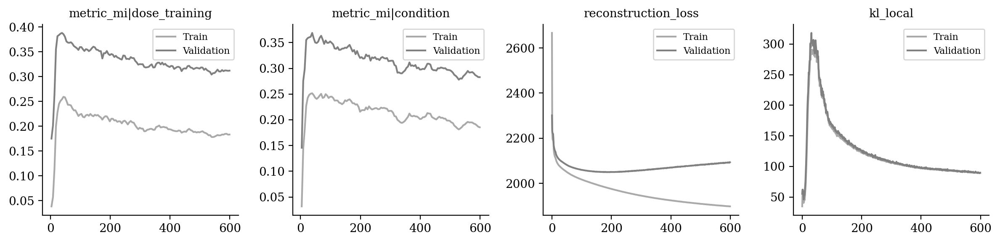

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|dose_training", "metric_mi|condition", 
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

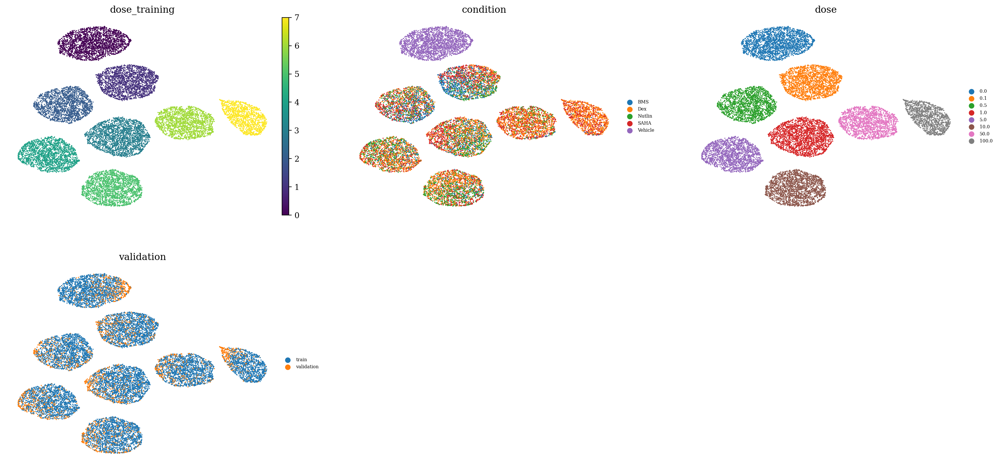

In [13]:
sublatent = DM.configurations.get_by_obs_key("dose_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

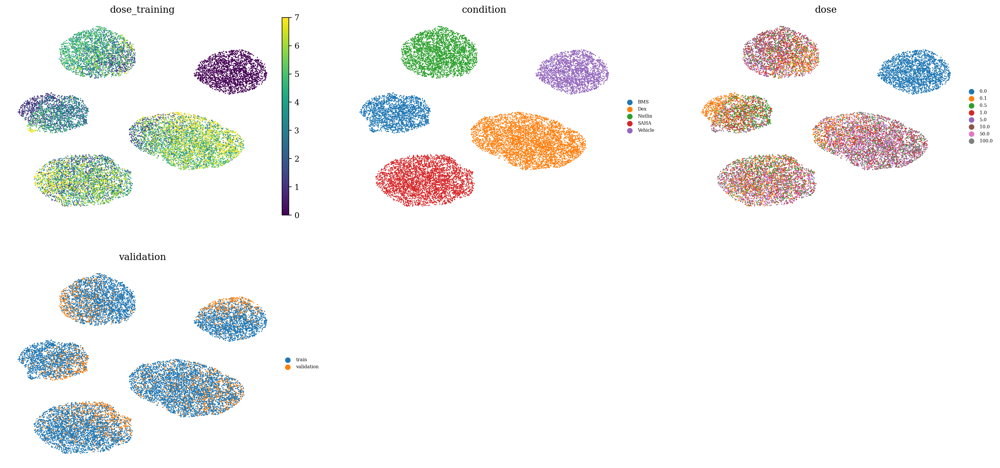

In [14]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

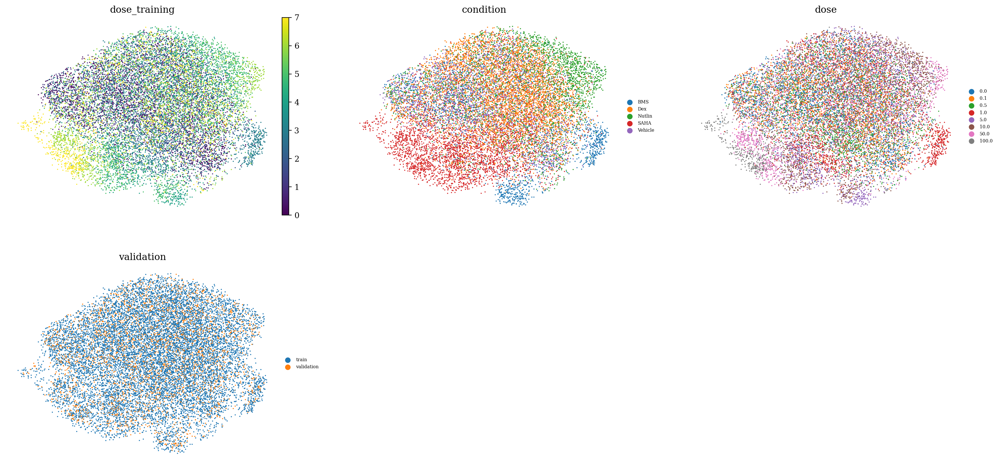

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

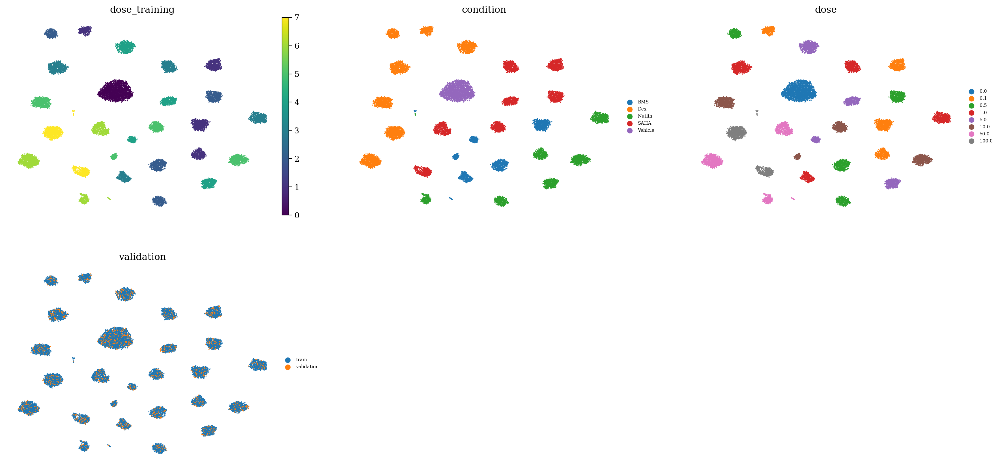

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [17]:
1

1